In [1]:
import copy
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import importlib
import bandpass_helpers
import pickle

%matplotlib inline
matplotlib.rcParams.update({'font.size': 13})

## initialize some constants
c=3e8     # speed of light

FTS_frequency_cal = 1.0239   # FTS calibration factor- based on the path length difference not
                            # being exactly, found in raytracing simulations and verified via
                            # the geometry of the FTS layout
        
spike_threshold = 15.  ## S/N of a spike
cut_threshold = 5  ## ratio rms(center)/rms(sides) of interferogram

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# This should be the smallest throw we see in all the runs
# really 
FTS_stage_step_size = 0.15 * 1e-3  # FTS step size in meters
FTS_stage_throw  = 37.5*2. *1e-3      # total throw extent in meters 

# estimate the resolution and Nyquist frequency    
Nyquist_Freuqency= (c/FTS_stage_step_size/4.)/2. * FTS_frequency_cal
Resolution = c/FTS_stage_throw/4.* FTS_frequency_cal
print("Nyquist frequency: ", Nyquist_Freuqency/1e9, "GHz")
print("FTS resolution: ", Resolution/1e9, "GHz")

Nyquist frequency:  255.97500000000002 GHz
FTS resolution:  1.0239 GHz


In [3]:
data_sets = []
data_attrs = []

# get the FTS positions that we're using for all the bands
fts_positions = np.round(np.arange(-1 * FTS_stage_throw / 2, FTS_stage_throw / 2 + .0001, 
                                   FTS_stage_step_size) / 1e-3, 2)

for run in range(1):
    data = np.load('FTS_data_mv28/run_%s_interferograms.npz' %run)
    
    # get the FTS positions that are the same for all
    fts_mirror_positions = np.round(data['fts_mirror_positions'], 2)
    common_positions, _, data_slice = np.intersect1d(fts_positions, fts_mirror_positions, 
                                                     return_indices=True)
    # make sure the FTS throw is larger than or at the same throw as our parameter
    #assert (common_positions == fts_positions).all()
    
    # now slice the interferogram data by these positions
    interferogram_data = data['data'][data_slice, :]
    
    bands = data['bands']
    channels = data['channels']
    det_ids = data['det_ids']
    #xy_position = data['xy_position']
    #bias_groups = data['bias_groups']
    
    # filter out the good positions that we want to look at- this time they're all good!
    #print('using data from XY position %s' %xy_position)
    
    data_sets.append(interferogram_data)
    data_attrs.append(dict(bands=bands, channels=channels, det_ids=det_ids))

In [4]:
n_samples = np.size(data_sets[0][:, 0])
#n_samples = len(bandpass_helpers.center_interferogram(data_sets[0][:, 762]))
mask90 = bandpass_helpers.filter_frequency_mask(n_samples, [[80, 110]], c, 
                                                FTS_stage_step_size, FTS_frequency_cal)
mask150 = bandpass_helpers.filter_frequency_mask(n_samples, [[125, 170]], c, 
                                                 FTS_stage_step_size, FTS_frequency_cal)
maskOther = bandpass_helpers.filter_frequency_mask(n_samples, [[190, 200]], c, 
                                                   FTS_stage_step_size, FTS_frequency_cal)
maskOutside = bandpass_helpers.filter_frequency_mask(n_samples, [[20, 50], [200, 225]], c, 
                                                     FTS_stage_step_size, FTS_frequency_cal)

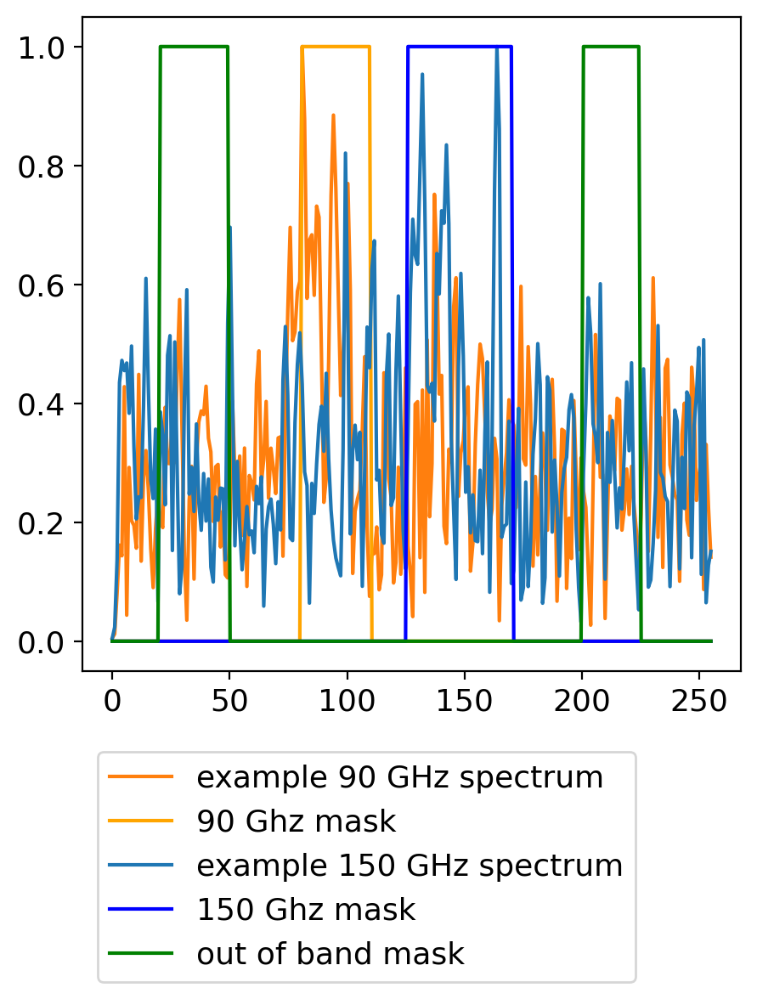

In [5]:
# For estimates of the tophat frequency filters to use for determining the cuts
plt.figure(figsize=(5, 5))
freq = bandpass_helpers.frequency(np.ones(n_samples), c, FTS_stage_step_size, FTS_frequency_cal)
inter_90 = bandpass_helpers.get_cleaned_interferogram(data_sets[0][:, 1210], 5, 10, 7, polyfit=True)
inter_150 = bandpass_helpers.get_cleaned_interferogram(data_sets[0][:, 73], 5, 10, 7, polyfit=True)
plt.plot(freq / 1e9, inter_90 / np.max(inter_90), label='example 90 GHz spectrum', color='tab:orange')
plt.plot(freq / 1e9, mask90, label='90 Ghz mask', color='orange')
plt.plot(freq / 1e9, inter_150 / np.max(inter_150), label='example 150 GHz spectrum', color='tab:blue')
plt.plot(freq / 1e9, mask150, label='150 Ghz mask', color='blue')
plt.plot(freq / 1e9, maskOutside, label='out of band mask', color='green')
plt.legend(loc='upper left', bbox_to_anchor=(0, -.1))

plt.show()

/global/u1/t/talford/software/passband-analysis/bandpass_helpers.py:102: RuntimeWarning: invalid value encountered in sqrt
  data = np.sqrt(data)
/global/u1/t/talford/conda_envs/current_sotodlib/lib/python3.12/site-packages/numpy/_core/_methods.py:223: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/global/u1/t/talford/conda_envs/current_sotodlib/lib/python3.12/site-packages/numpy/_core/_methods.py:181: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/global/u1/t/talford/conda_envs/current_sotodlib/lib/python3.12/site-packages/numpy/_core/_methods.py:215: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/global/u1/t/talford/conda_envs/current_sotodlib/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/global/u1/t/talford/c

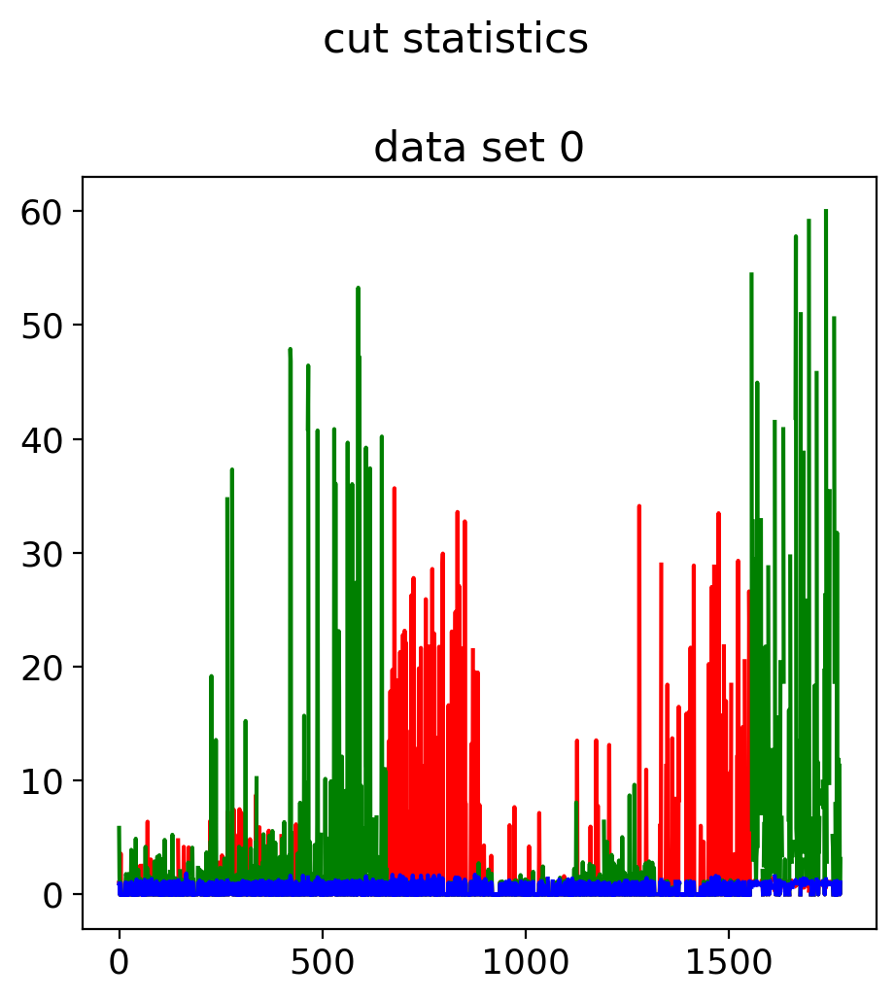

In [6]:
cut_stats_total_indiv = []
cut_stats_total_combined = []

fig, axes = plt.subplots(1, 1, figsize=(5, 5), sharex=True)
axes = np.array([axes])
axes = axes.flatten()
plt.suptitle('cut statistics', y=1.03)
fig.tight_layout()

for i in range(len(data_sets)):
    data = data_sets[i]
    # find the good channels
    cut_stats_indiv, cut_stats_combined =  bandpass_helpers.find_interferograms_clean(
        data, [mask90, mask150, maskOther], maskOutside, spike_threshold)
    # identify the good channels.
    good_chans = np.transpose(np.where(cut_stats_combined > cut_threshold))
    N_good = np.size(good_chans)
    ## plot the cuts
    for stat, color in zip(cut_stats_indiv, ['r', 'g', 'b']):
        axes[i].plot(np.abs(stat), color=color)

    axes[i].set_title("data set " + str(i))
        
    cut_stats_total_indiv.append(cut_stats_indiv)
    cut_stats_total_combined.append(cut_stats_combined)
    
plt.show()

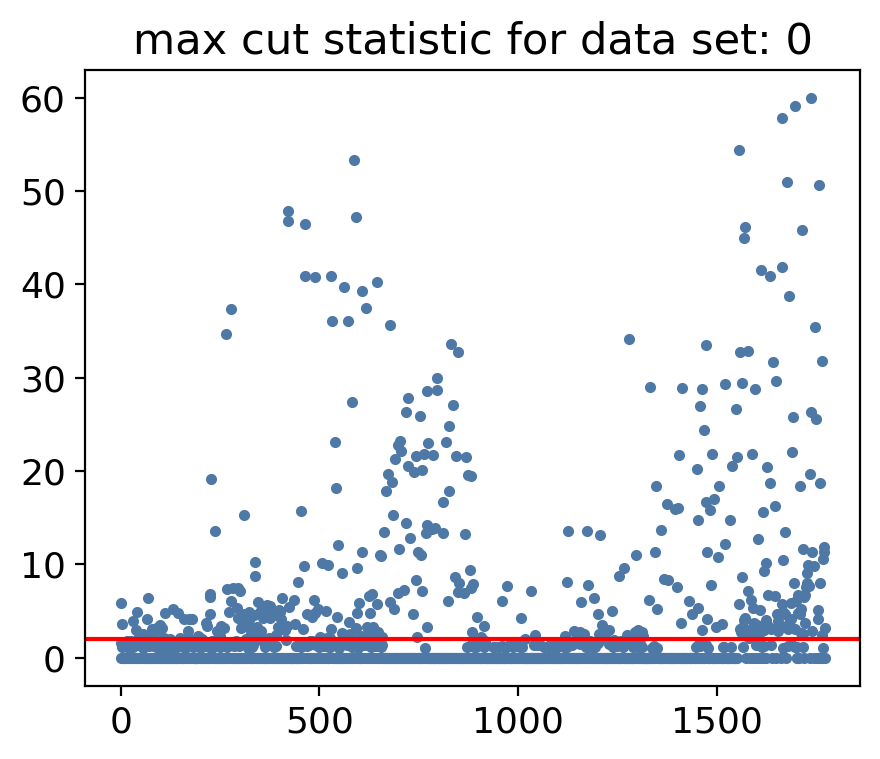

398 retained channels
det:  0 passband number:  1 S/N:  5.848947487110399
det:  4 passband number:  0 S/N:  3.5914066880727806
det:  30 passband number:  1 S/N:  3.915783389949839
det:  38 passband number:  1 S/N:  3.0028220446743554
det:  41 passband number:  1 S/N:  4.896985264198566
det:  47 passband number:  1 S/N:  2.1726001070384195
det:  51 passband number:  0 S/N:  2.4973806242416052
det:  55 passband number:  0 S/N:  2.5175714307087764
det:  65 passband number:  1 S/N:  4.184403857587258
det:  69 passband number:  1 S/N:  2.343252341721505
det:  70 passband number:  0 S/N:  6.388943950808701
det:  78 passband number:  0 S/N:  3.075092379185612
det:  87 passband number:  1 S/N:  2.89463370356371
det:  94 passband number:  1 S/N:  3.318895040504309
det:  97 passband number:  1 S/N:  2.8459053456616576
det:  99 passband number:  1 S/N:  3.4391790824565063
det:  105 passband number:  1 S/N:  3.1155864791564722
det:  110 passband number:  1 S/N:  2.0888909187802738
det:  112 passba

In [7]:
# Cut threshold is generally set to 5-10 here.
cut_threshold = 2

total_good_band_channels = []
total_channel_signal_noise_values = []


for i in range(len(data_sets)):
    SNmax, chan_max = bandpass_helpers.band_classifier(cut_stats_total_indiv[i])

    plt.title("max cut statistic for data set: " + str(i))
    plt.plot(SNmax,".")
    plt.axhline(y=cut_threshold, color='r')
    plt.show()

    chan_test = np.logical_and(SNmax > cut_threshold,chan_max !=-1)
    #chan_test = np.logical_and(SNmax < cut_threshold_uppercut,chan_test) - don't need this anymore..
    channels_kept = np.ravel(np.array(np.where(chan_test)))
    N_retained =  np.size(channels_kept)

    print(N_retained, "retained channels")


    channel_signal_noise_values = []
    for j in range(N_retained):
        chan = channels_kept[j]
        print("det: ", chan, "passband number: ", chan_max[chan], "S/N: ", SNmax[chan])
        channel_signal_noise_values.append([chan, chan_max[chan], SNmax[chan]])

    total_channel_signal_noise_values.append(channel_signal_noise_values)
        
    
    good_band_channels = []
    for j in range(np.shape(cut_stats_total_indiv)[1]):
        good_band_channels.append(channels_kept[np.where(chan_max[channels_kept] == j)])
      
    total_good_band_channels.append(good_band_channels)
    
total_good_band_channels = np.array(total_good_band_channels, dtype='object')

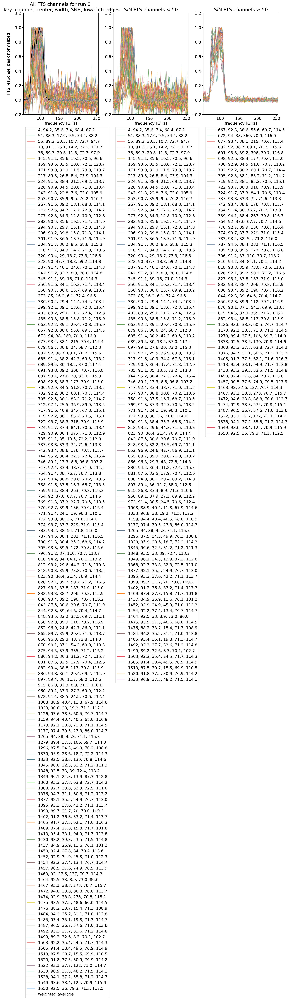

weighted mean: 93.4, weighted rms: 1.0
removing channels [ 373.  697. 1437.] with band centers values of [84.98 99.13 84.93] from passbands: # weighted deviations from weighted mean = [5.08 4.16 5.11]


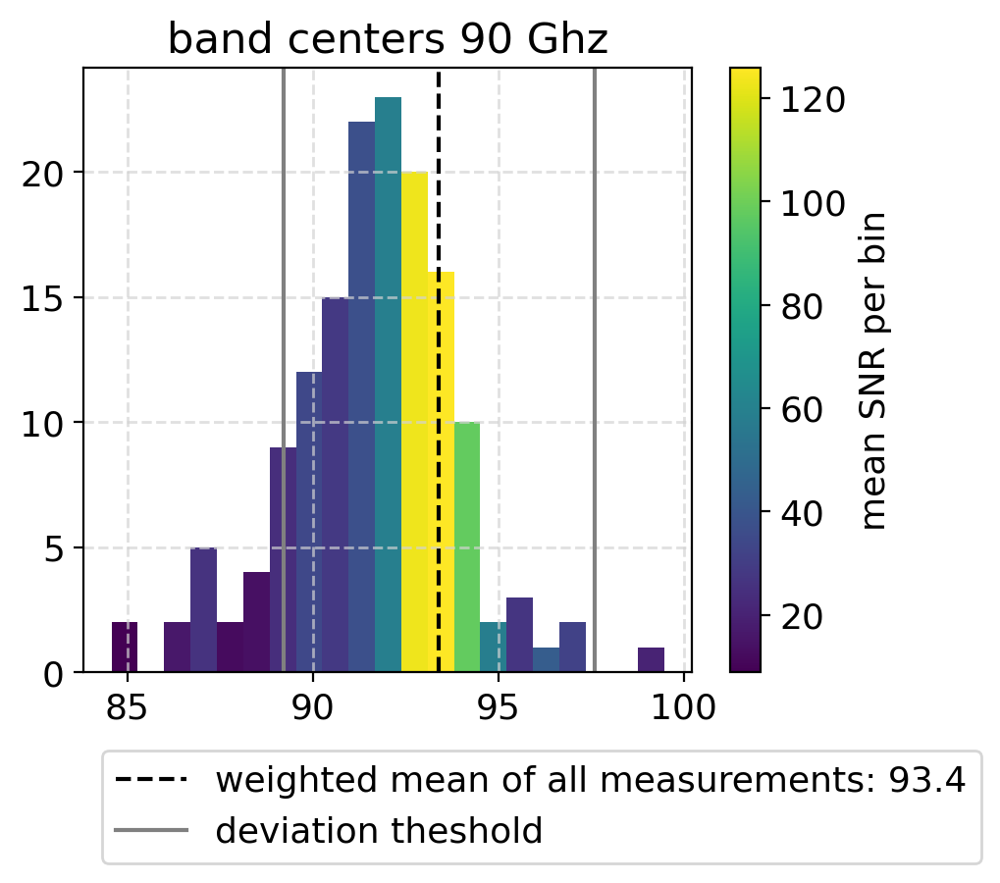

----------------------------------------------------------------------
weighted mean: 38.1, weighted rms: 1.5
removing channels [  51.  217.  243.  712.  746.  771.  852. 1349.] with band widths values of [17.59 26.84 22.82 25.52 13.35 24.14 24.57 24.29] from passbands: # weighted deviations from weighted mean = [7.68 4.06 5.63 4.58 9.35 5.12 4.95 5.06]


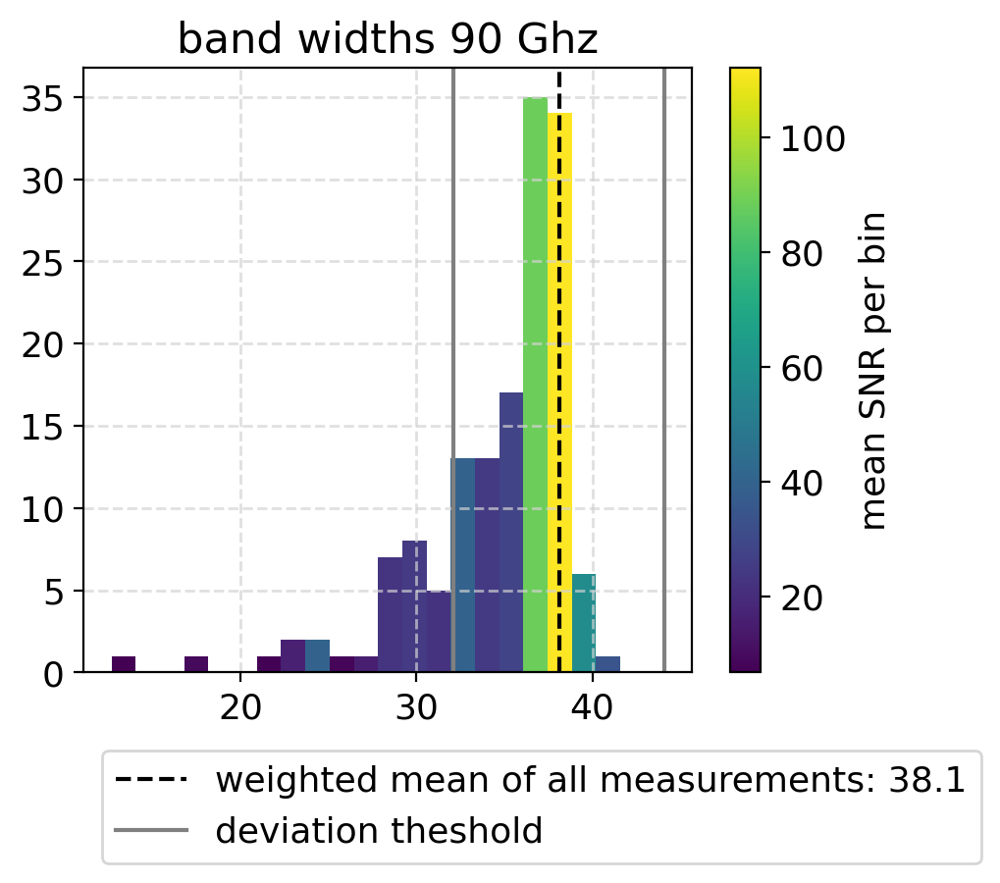

----------------------------------------------------------------------
weighted mean: 70.8, weighted rms: 0.6
removing channels [ 689. 1177. 1475.] with band lower edges values of [87.007 85.991 66.028] from passbands: # weighted deviations from weighted mean = [14.1  13.21  4.16]


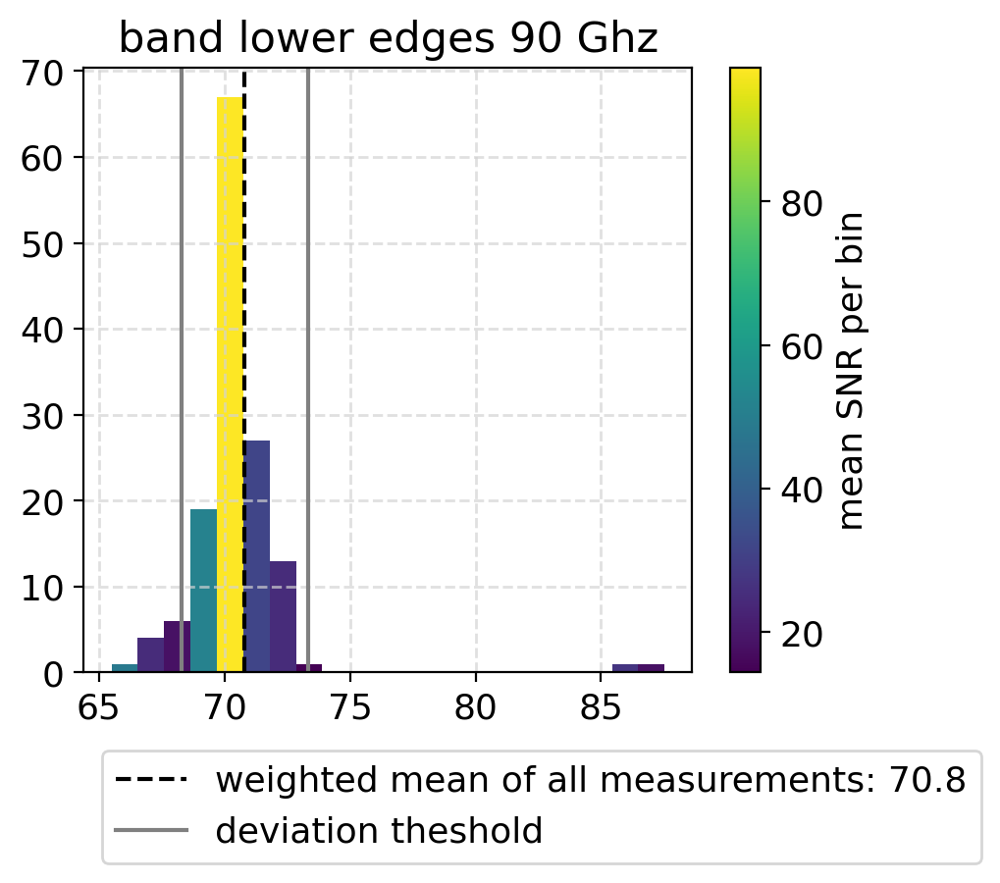

----------------------------------------------------------------------
weighted mean: 115.6, weighted rms: 1.2
removing channels [   4.   55.   78.  145.  159.  320.  380. 1409. 1464. 1499.] with band upper edges values of [ 87.215  94.695  97.925  96.57  128.676 126.756 103.22  101.766  86.02
 102.731] from passbands: # weighted deviations from weighted mean = [15.98 11.63  9.74 10.53  8.16  7.05  6.66  7.51 16.68  6.94]


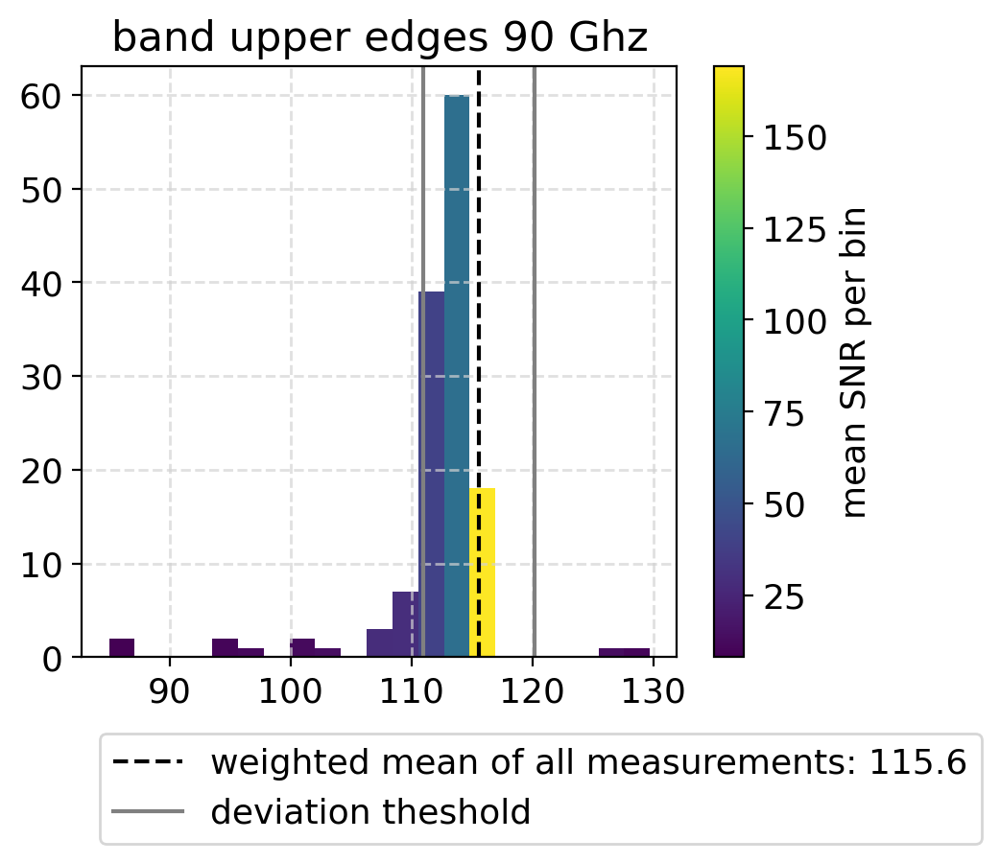

----------------------------------------------------------------------


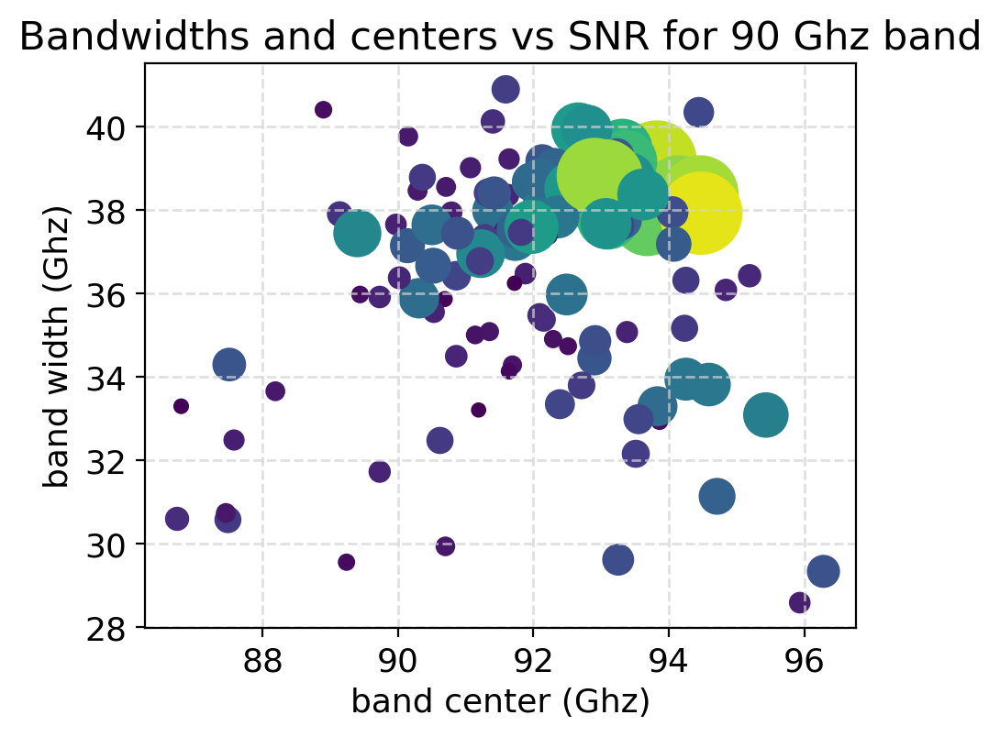

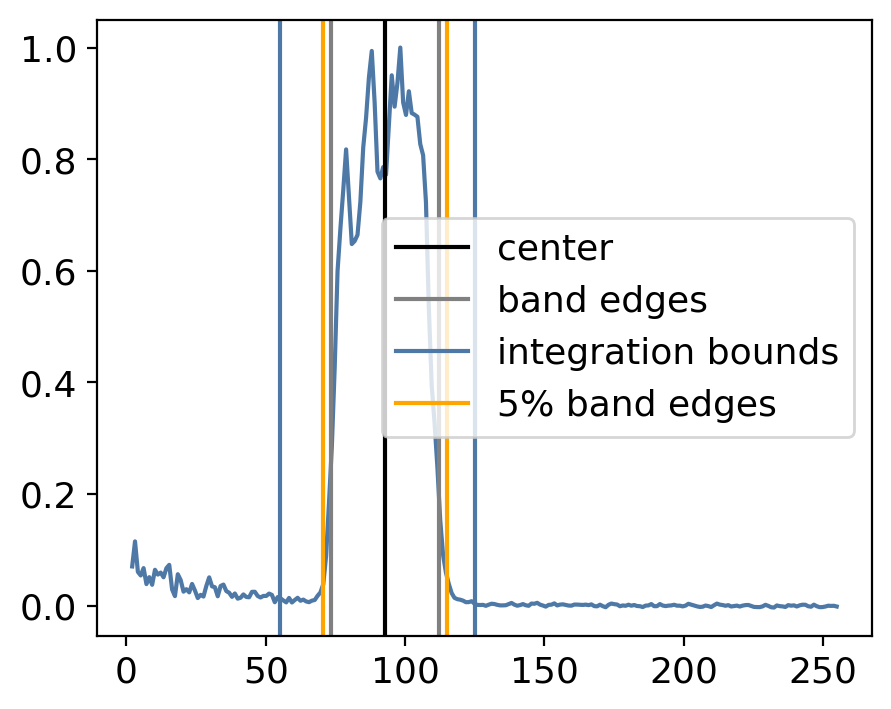

band center: 92.70334066167321, band width: 38.65186371539116
----------------------------------------------------------------------


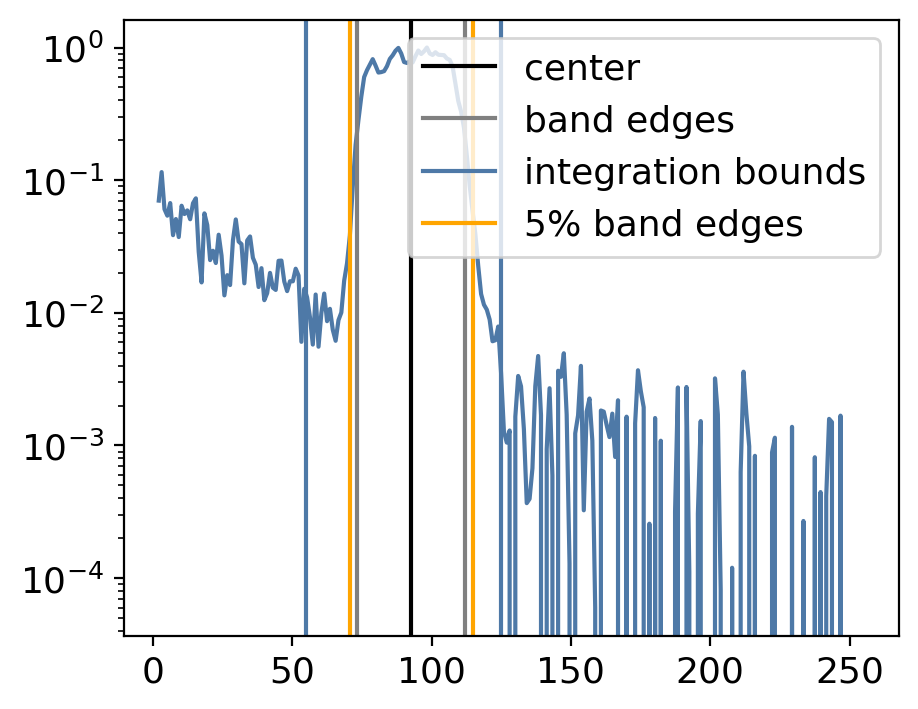

band center: 92.70334066167321, band width: 38.65186371539116
----------------------------------------------------------------------
weighted mean: 93.4, weighted rms: 1.0


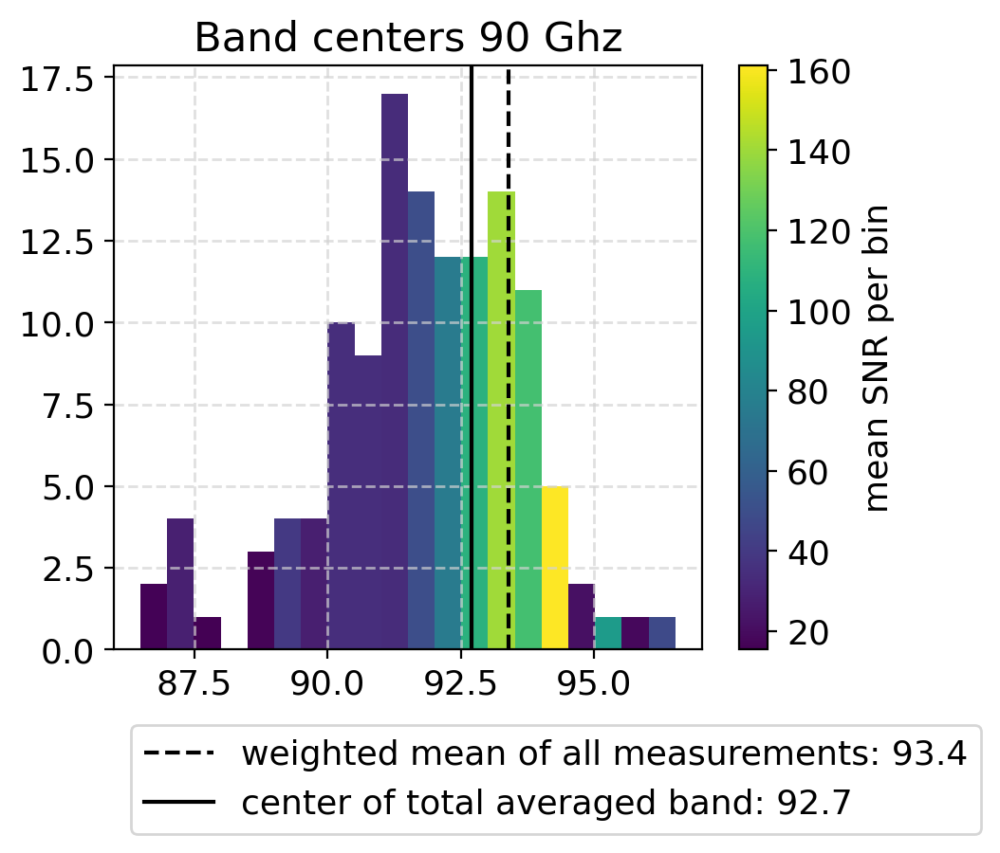

weighted mean: 38.1, weighted rms: 1.3


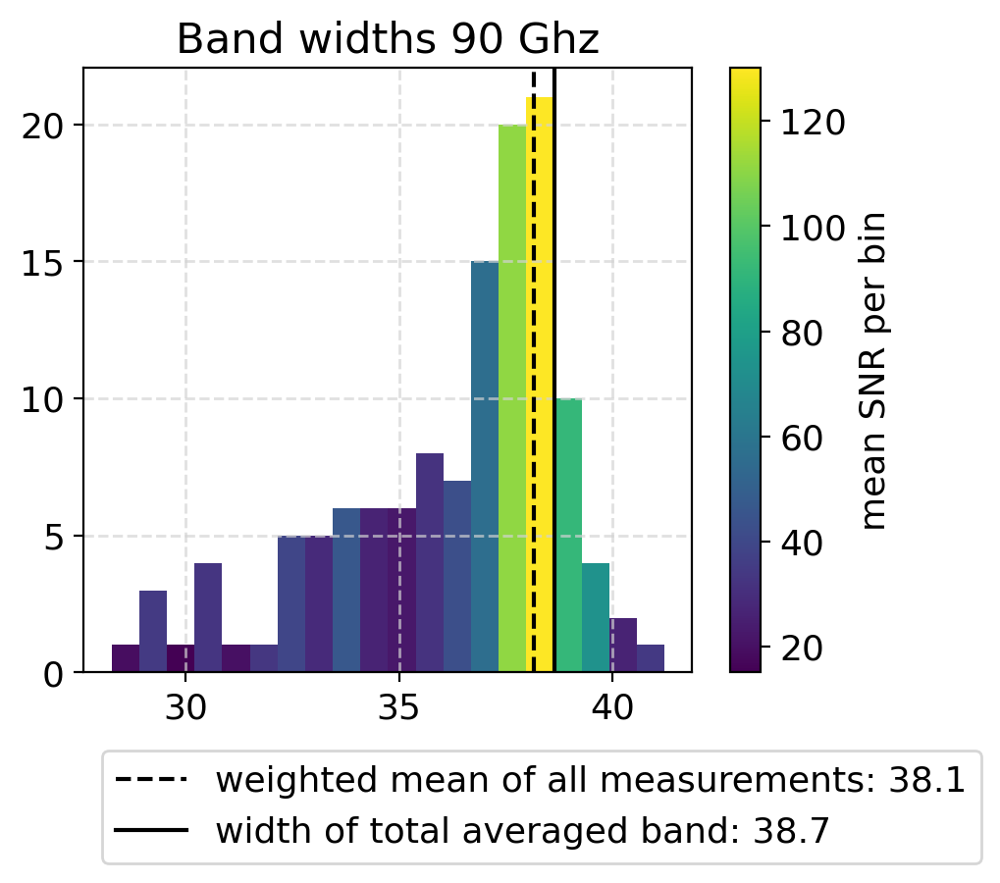

weighted mean: 70.8, weighted rms: 0.4


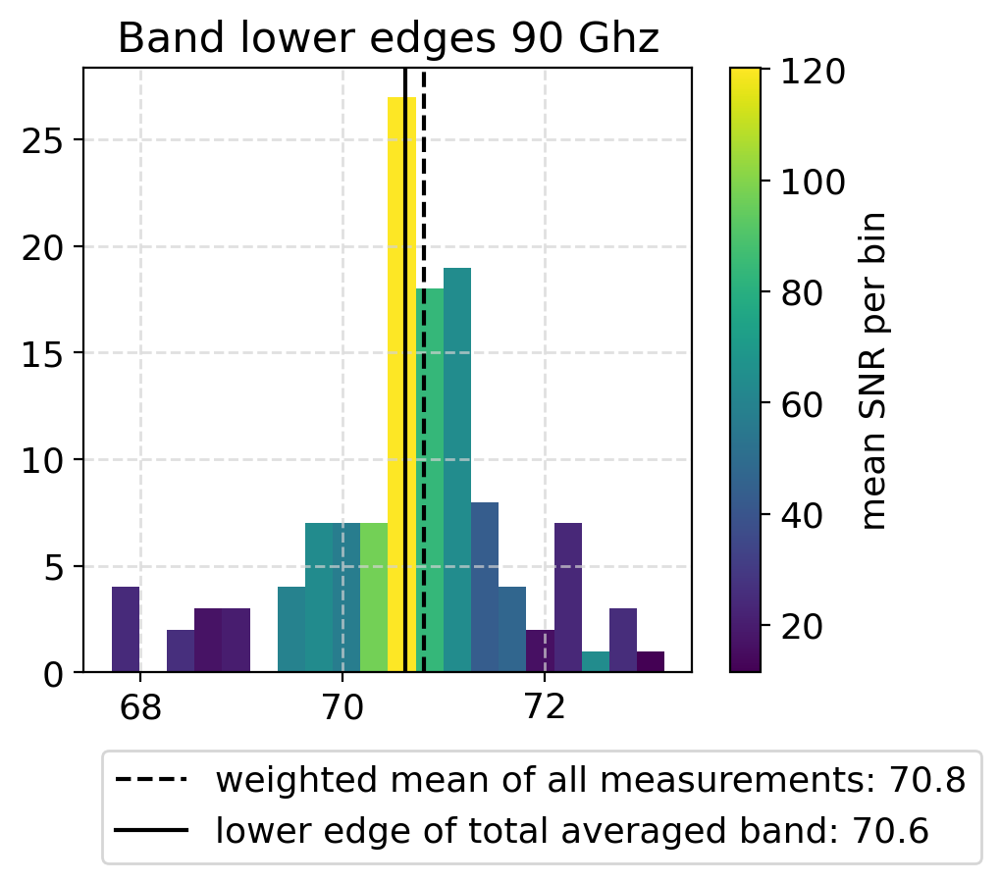

weighted mean: 115.6, weighted rms: 1.0


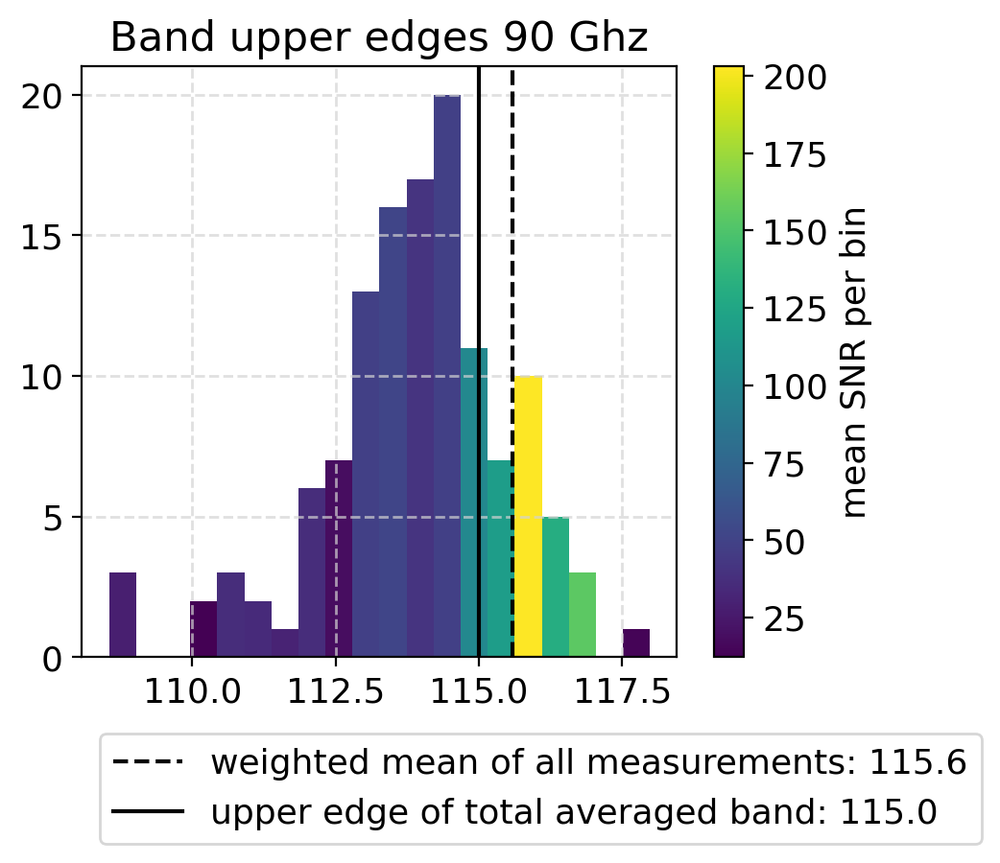

/global/u1/t/talford/software/passband-analysis/bandpass_helpers.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


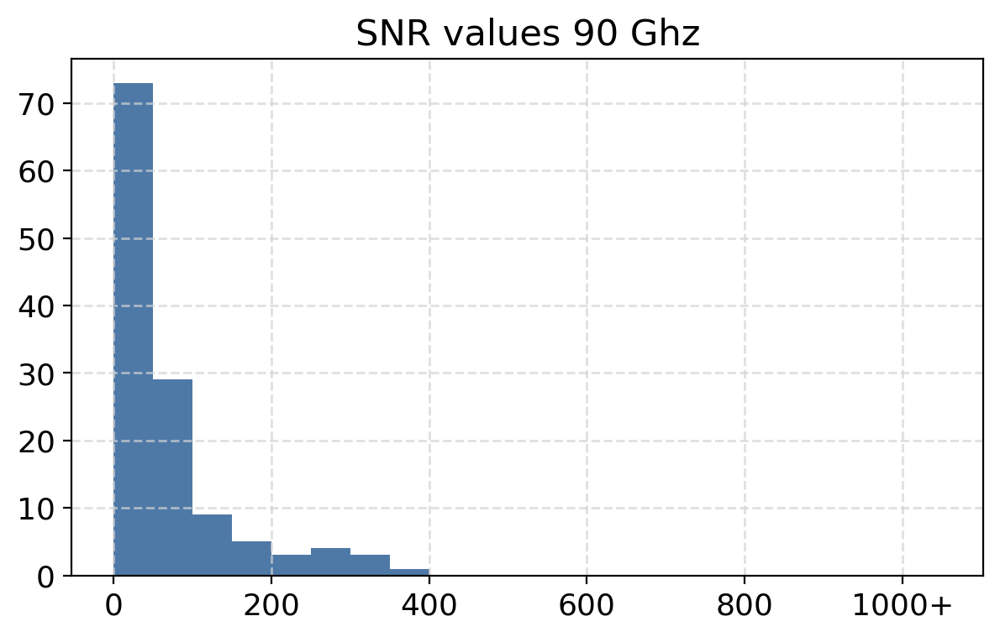

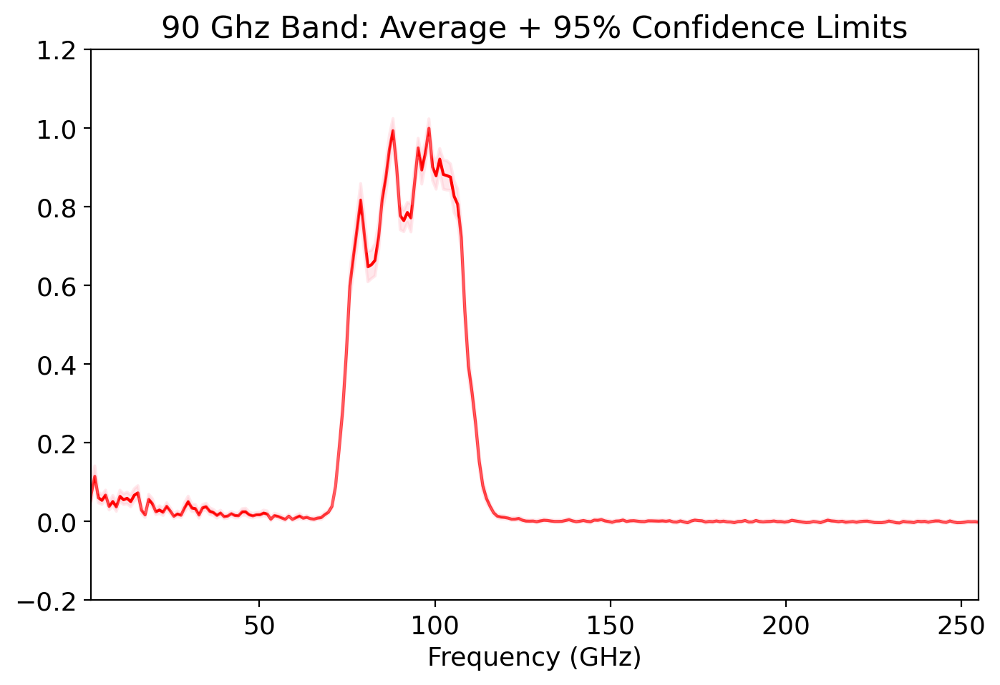

In [8]:
def band_average_snr_weight(snr_values, max_snr=80):
    '''Ensures that high SNR data is not given too much weight.
    
    Weights low SNRs by SNR^2, and high SNRs (above max_snr)
    by (max_snr^2).
    '''
    snrs_above_max = (snr_values > max_snr)
    weights = np.square(snr_values)
    weights[snrs_above_max] = (max_snr ** 2)
    return weights

bin_min_freq_90 = 55
noise_bounds_90 = (150, None)
lower_bound_90 = 55.
upper_bound_90 = 125.

args_90 = ('90', 0, data_sets, total_good_band_channels, FTS_stage_step_size, FTS_frequency_cal)
kwargs_90 = dict(take_sqrt=False, run_plots=True, output_vals=True, bin_min_freq=bin_min_freq_90, 
    noise_bounds=noise_bounds_90, lower_bound=lower_bound_90, upper_bound=upper_bound_90,
    plot_freq_range=None, fit_noise=False, high_snr_change=1000, weight_func=band_average_snr_weight, 
    low_snr_cutoff=5)

importlib.reload(bandpass_helpers)
all_attrs_90 = bandpass_helpers.run_through_bands(*args_90, **kwargs_90)

lower edge not fitted...
lower edge not fitted...
lower edge not fitted...
lower edge not fitted...
lower edge not fitted...
lower edge not fitted...


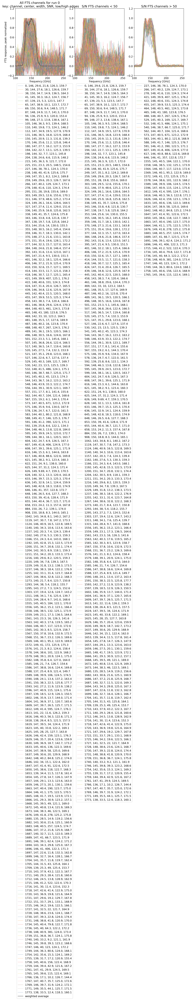

weighted mean: 147.2, weighted rms: 1.2
removing channels [  94.  204.  347.  567.  578. 1303. 1588. 1618. 1680. 1766. 1773.] with band centers values of [135.6  137.51 138.03 154.89 135.84 137.35 136.65 137.73 135.01 136.19
 138.08] from passbands: # weighted deviations from weighted mean = [5.51 4.54 4.27 4.36 5.39 4.62 4.98 4.42 5.82 5.21 4.25]


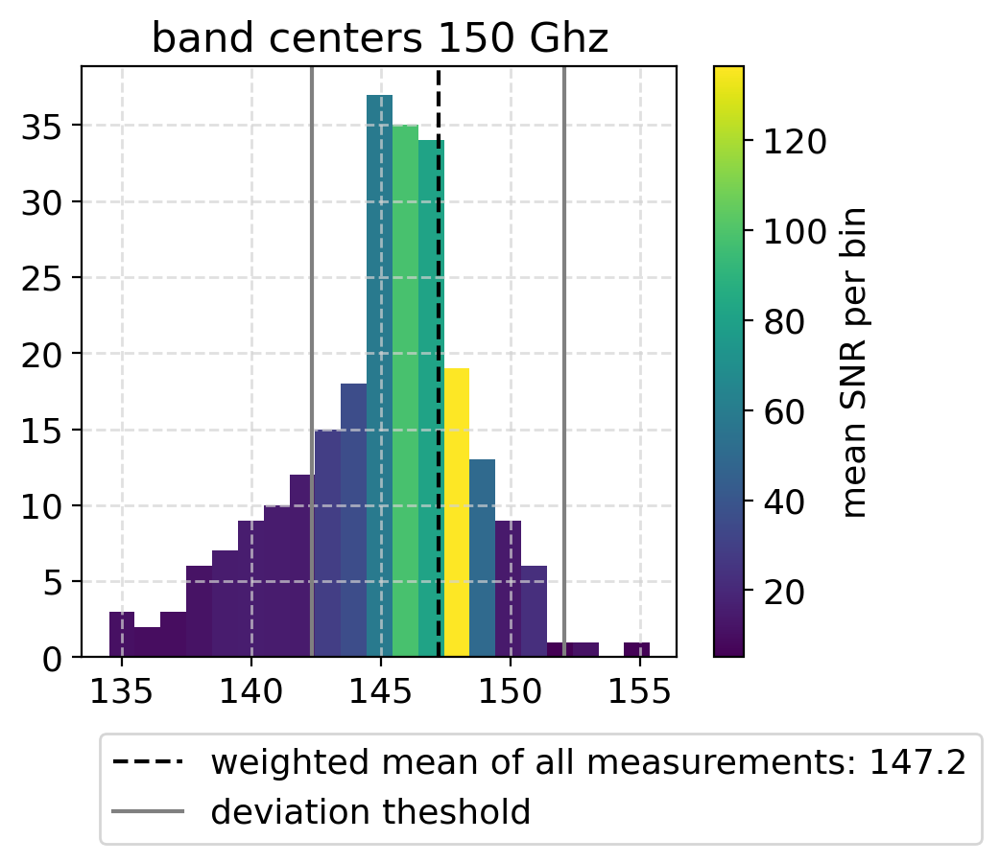

----------------------------------------------------------------------
weighted mean: 40.8, weighted rms: 1.3
removing channels [  47.   87.  110.  150.  170.  194.  225.  324.  336.  353.  384.  395.
  501.  527.  530.  557.  592.  604.  616.  622.  626.  658.  884.  908.
 1157. 1166. 1273. 1559. 1561. 1576. 1585. 1590. 1597. 1613. 1697. 1709.
 1712.] with band widths values of [23.01 24.91 19.77 20.86 25.6  22.71 23.28 26.09 25.92 25.6  24.56 21.44
 23.29 22.61 23.01 17.67 25.75 24.69 15.28 24.03  9.69 24.21 26.04 18.81
 20.27 24.34 21.67 23.1  23.32 21.27 21.02 24.09 18.46 22.02 22.59 25.34
 24.48] from passbands: # weighted deviations from weighted mean = [5.02 4.44 6.01 5.68 4.23 5.11 4.94 4.08 4.13 4.23 4.55 5.5  4.93 5.14
 5.02 6.65 4.18 4.51 7.38 4.71 9.09 4.65 4.09 6.3  5.86 4.61 5.43 4.99
 4.92 5.55 5.63 4.69 6.41 5.32 5.15 4.31 4.57]


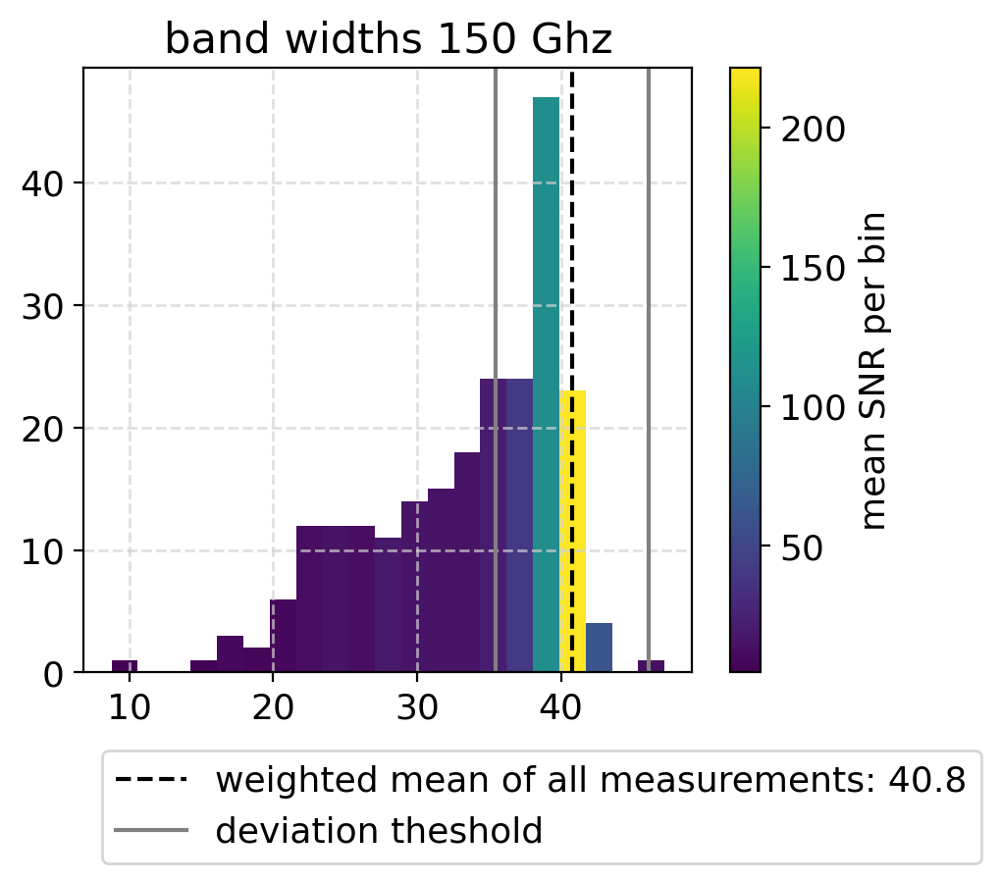

----------------------------------------------------------------------
weighted mean: 123.8, weighted rms: 1.2
removing channels [  38.   69.   99.  105.  295.  303.  355.  575. 1042. 1119. 1140. 1211.
 1220. 1229. 1315. 1602. 1630.] with band lower edges values of [136.471 148.466 138.354 139.431 155.633 155.633 145.394 133.998 140.211
 147.227 113.45  133.315 139.251 138.252 141.029 144.042 142.71 ] from passbands: # weighted deviations from weighted mean = [ 5.33 10.4   6.13  6.58 13.43 13.43  9.1   4.29  6.91  9.88  4.39  4.
  6.51  6.09  7.26  8.53  7.97]


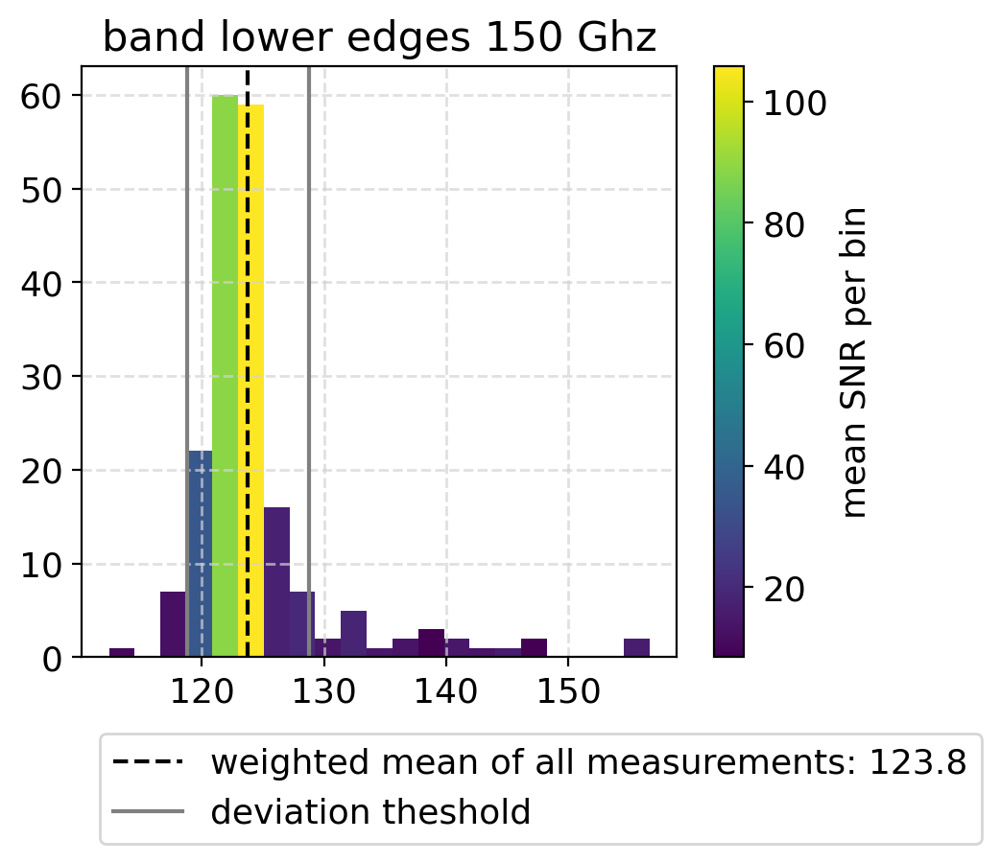

----------------------------------------------------------------------
weighted mean: 173.5, weighted rms: 2.5
removing channels [  41.  180.  198.  327.  343.  359.  520. 1293. 1295. 1311. 1593. 1654.
 1716. 1755.] with band upper edges values of [156.657 153.871 145.811 151.553 130.736 142.138 153.894 155.654 152.561
 139.664 138.226 147.909 152.282 155.387] from passbands: # weighted deviations from weighted mean = [ 4.08  4.83  6.99  5.45 11.05  7.98  4.82  4.35  5.18  8.65  9.03  6.43
  5.25  4.42]


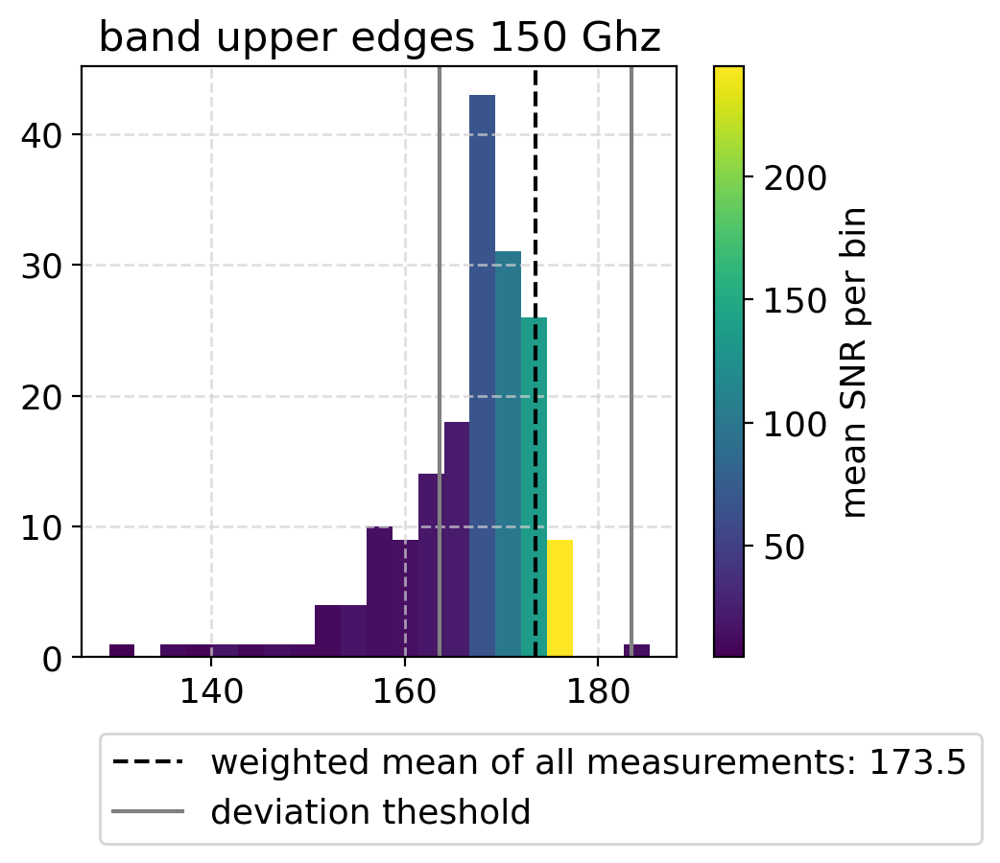

----------------------------------------------------------------------


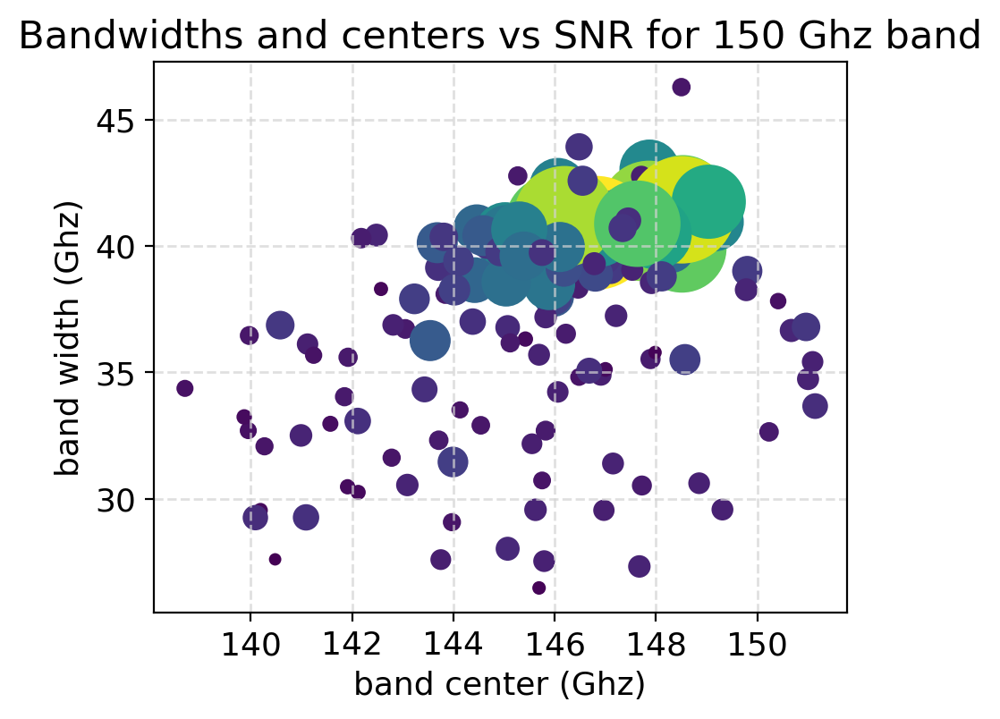

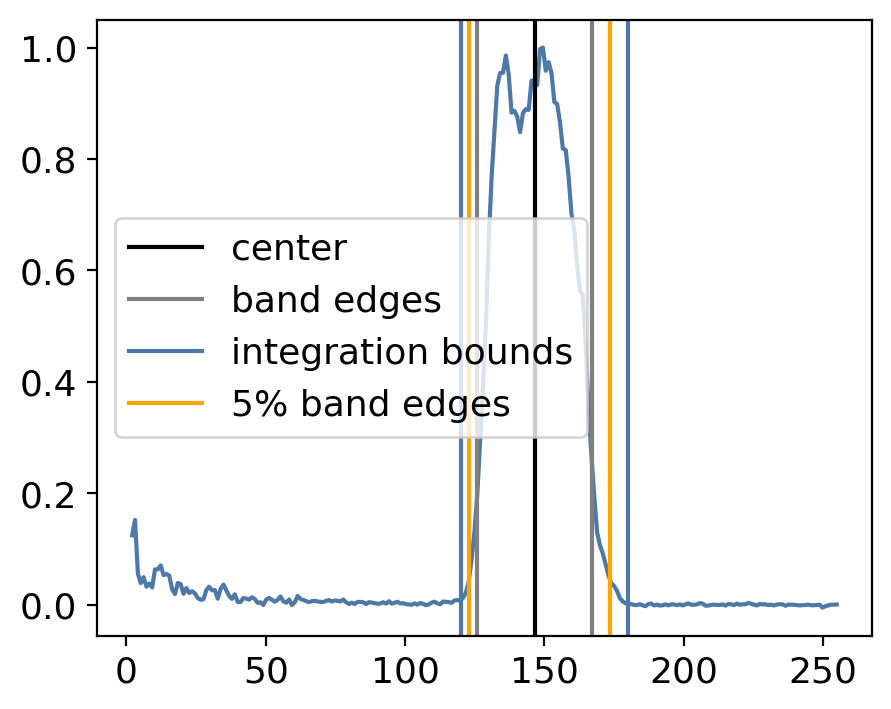

band center: 146.50904583533296, band width: 41.18300059717996
----------------------------------------------------------------------


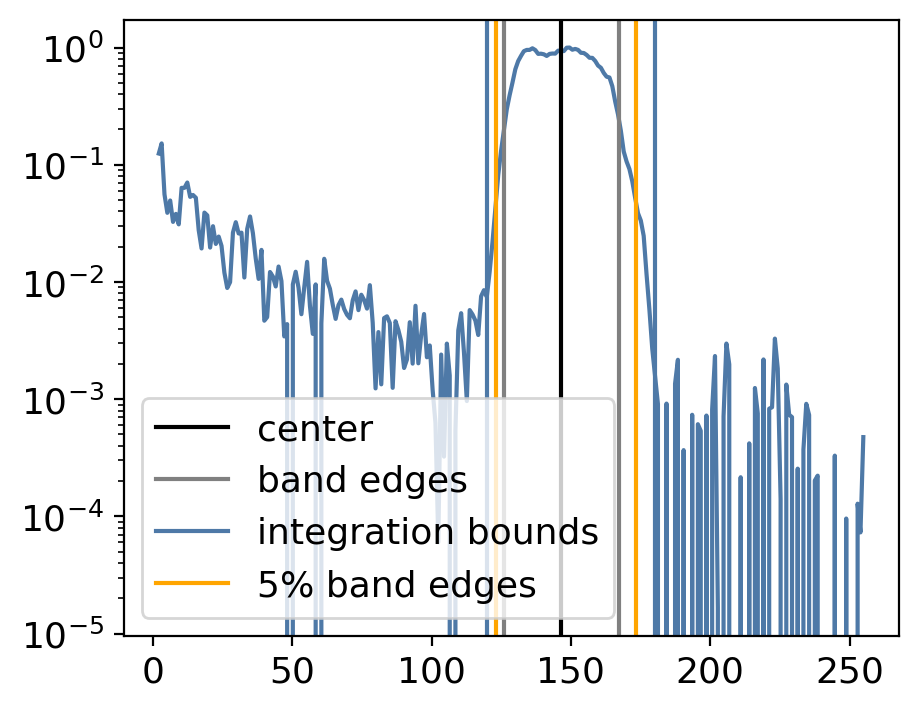

band center: 146.50904583533296, band width: 41.18300059717996
----------------------------------------------------------------------
weighted mean: 147.2, weighted rms: 1.2


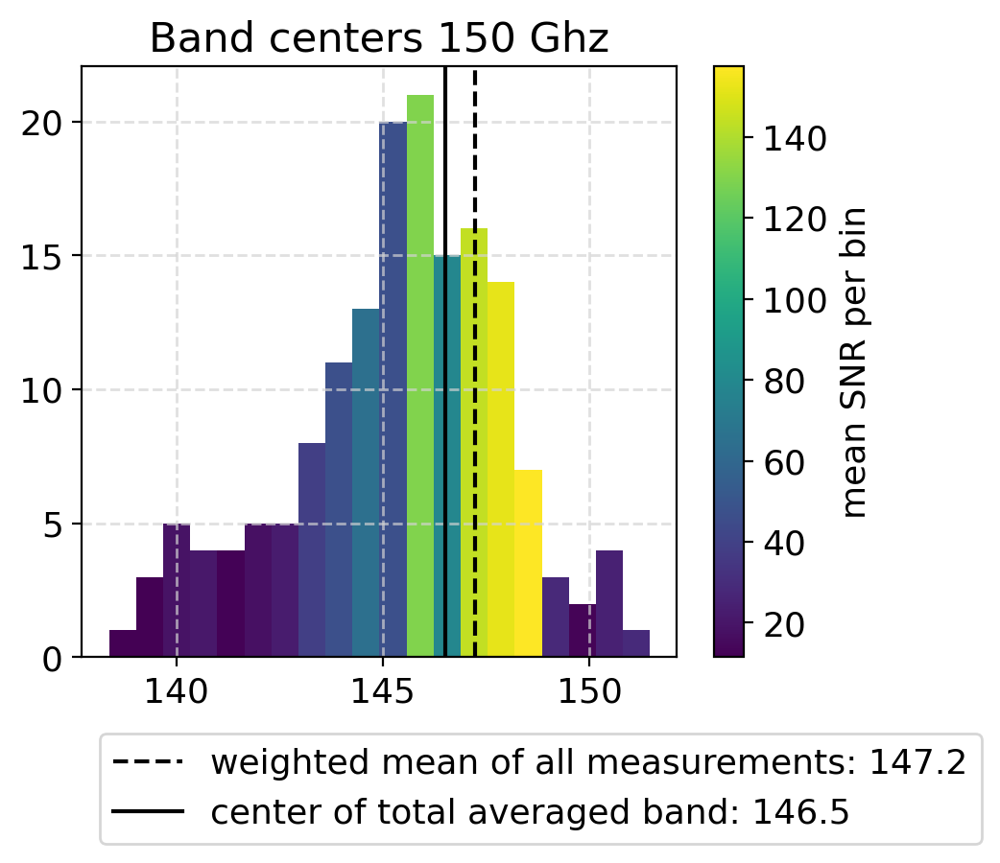

weighted mean: 40.8, weighted rms: 1.0


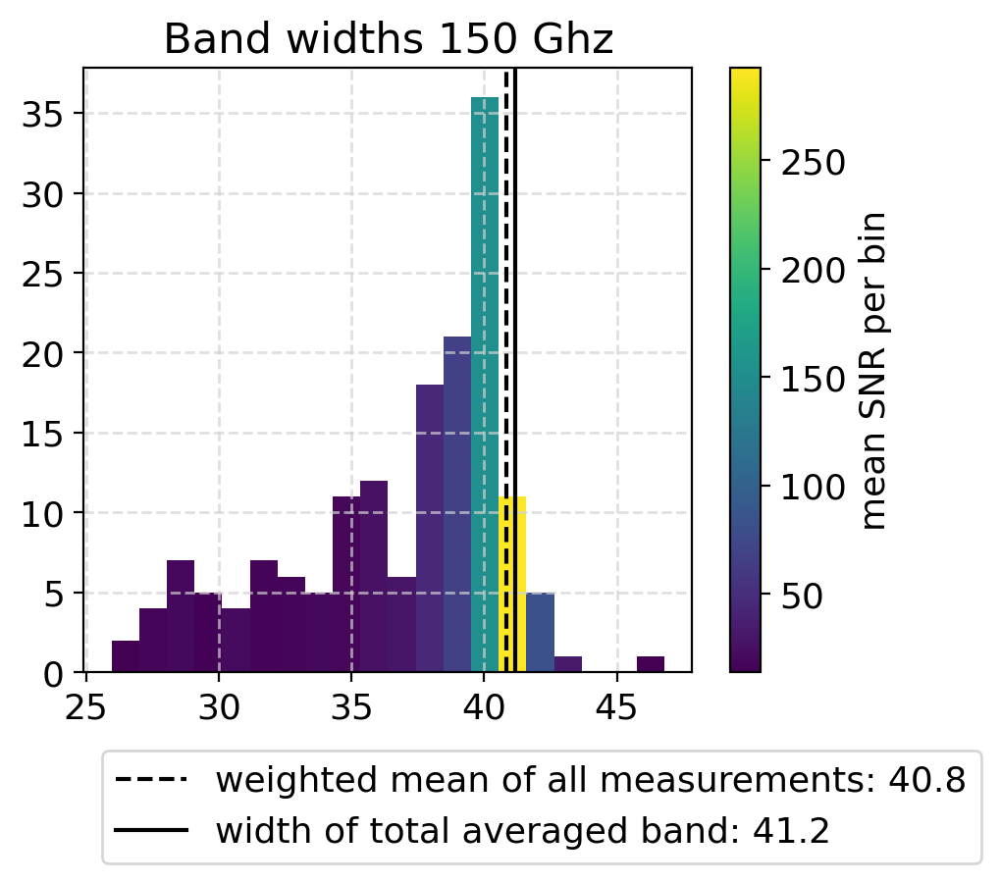

weighted mean: 123.8, weighted rms: 1.1


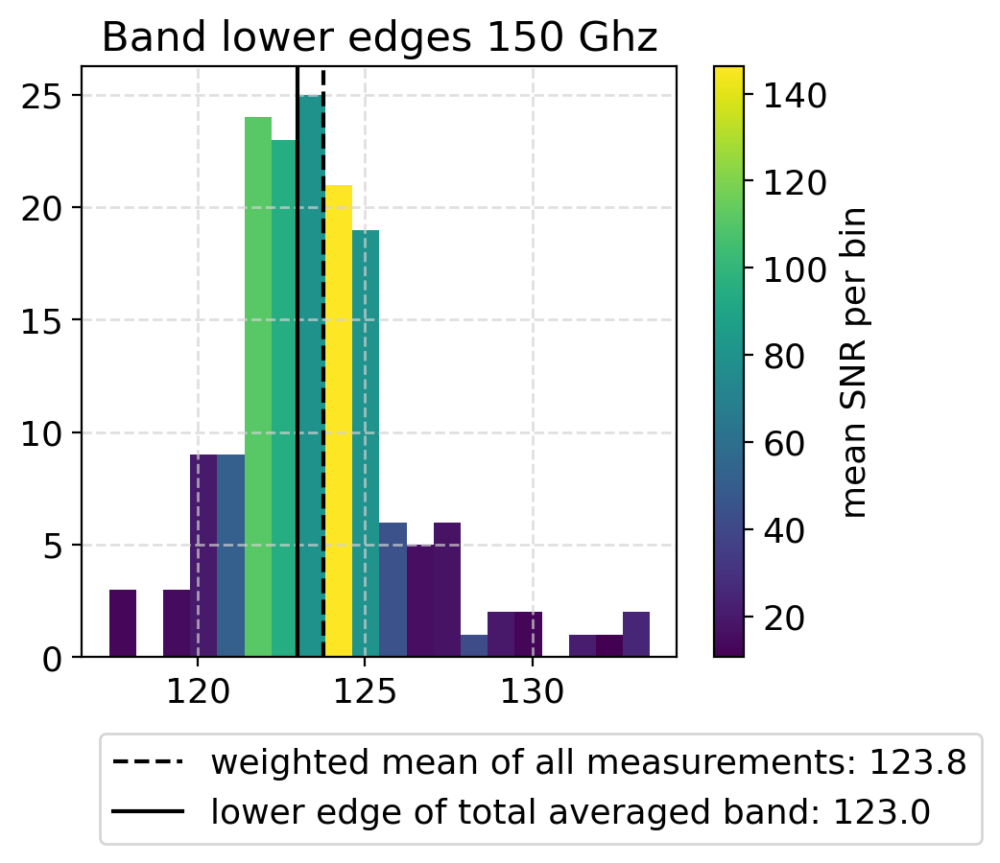

weighted mean: 173.5, weighted rms: 2.4


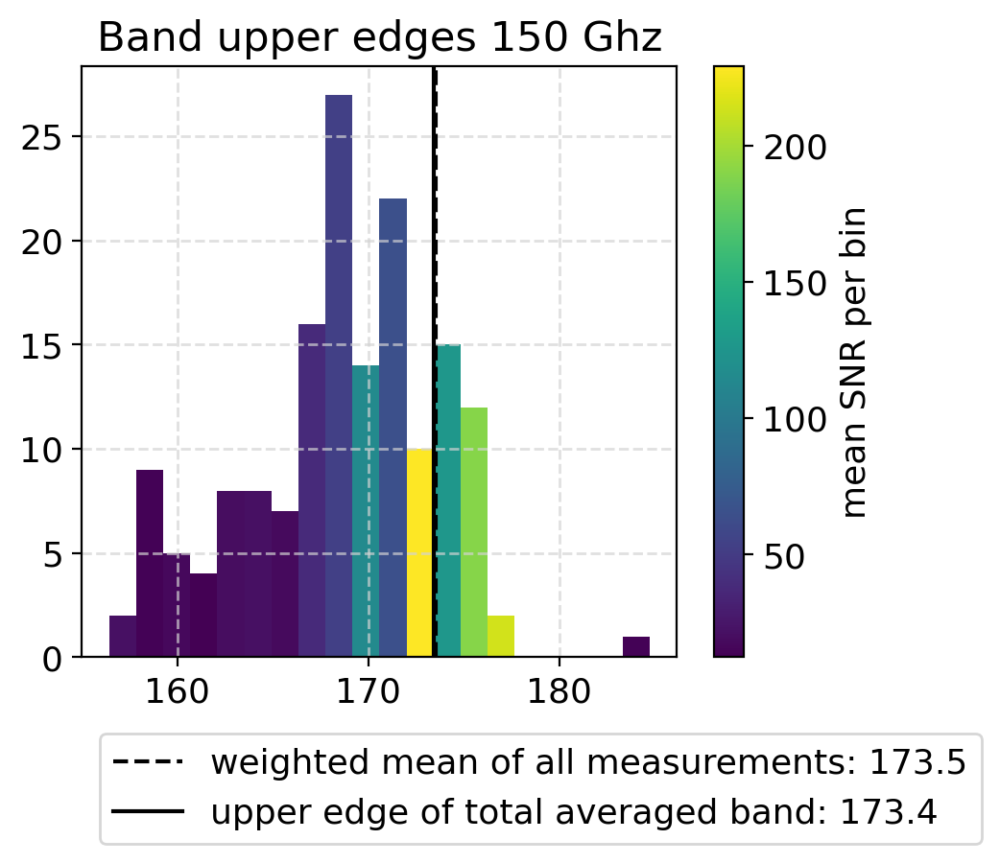

/global/u1/t/talford/software/passband-analysis/bandpass_helpers.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


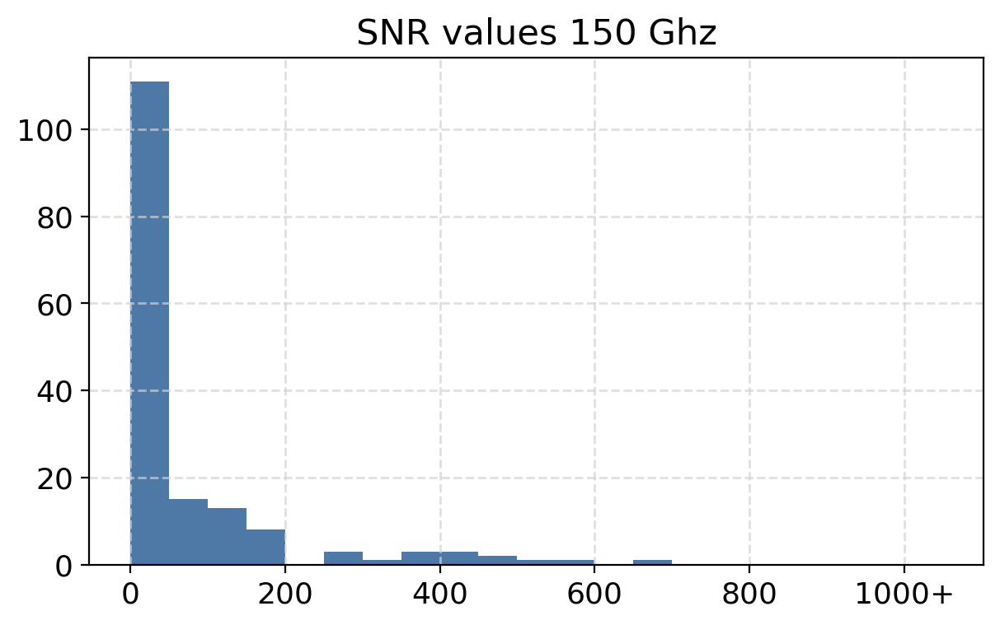

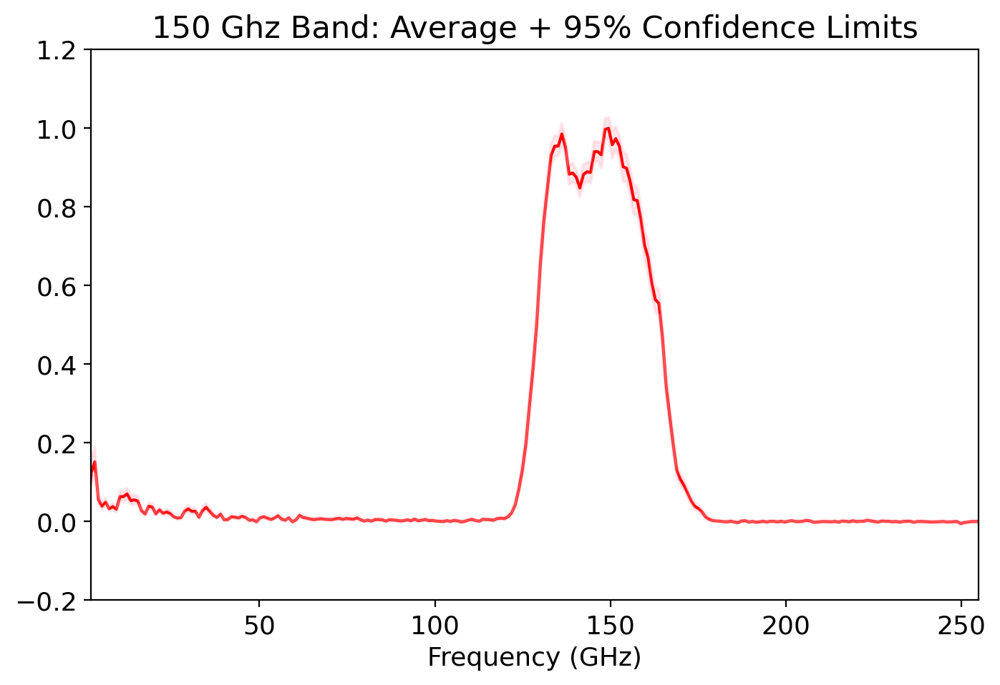

In [9]:
importlib.reload(bandpass_helpers)

bin_min_freq_150 = 100
noise_bounds_150 = (200, None)
lower_bound_150 = 120
upper_bound_150 = 180

args_150 = ('150', 1, data_sets, total_good_band_channels, FTS_stage_step_size, FTS_frequency_cal)
kwargs_150 = dict(take_sqrt=False, run_plots=True, output_vals=True, bin_min_freq=bin_min_freq_150, 
    noise_bounds=noise_bounds_150, lower_bound=lower_bound_150, upper_bound=upper_bound_150,
    plot_freq_range=None, fit_noise=False, high_snr_change=1000, weight_func=band_average_snr_weight, 
    low_snr_cutoff=1)

all_attrs_150 = bandpass_helpers.run_through_bands(*args_150, **kwargs_150)

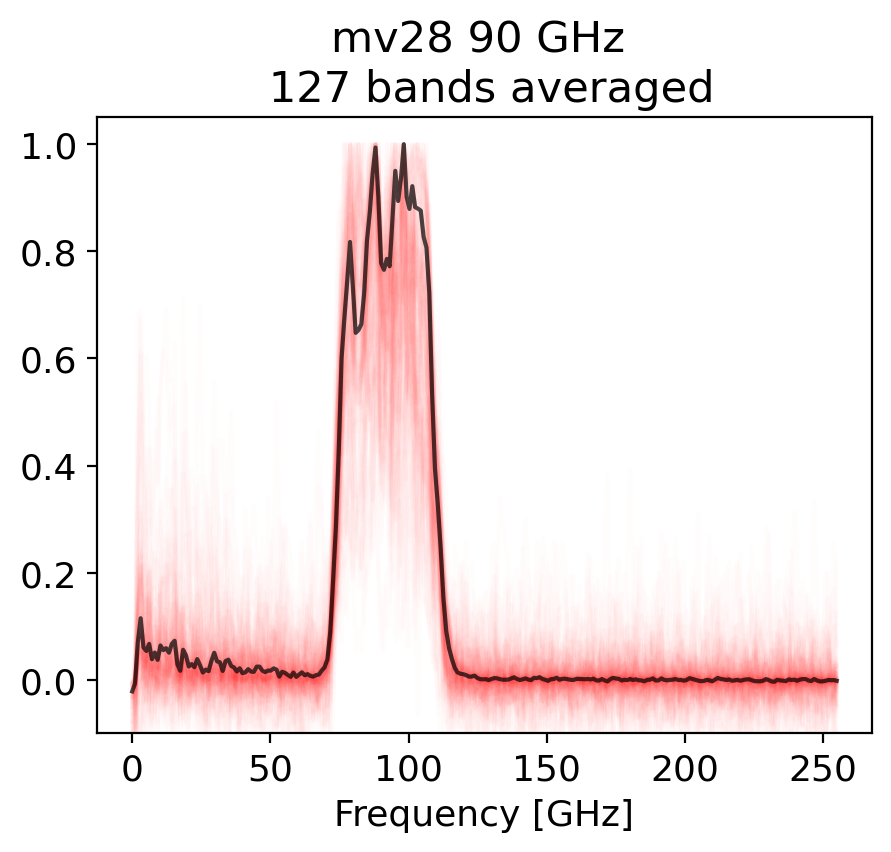

In [10]:
n_bands = len(all_attrs_90['total_band_data']['passbands'])
plt.plot(all_attrs_90['frequencies'] / 1e9, all_attrs_90['total_band_data']['passbands'].T, 
         alpha=0.01, color="red")
plt.plot(all_attrs_90['frequencies'] / 1e9, all_attrs_90['total_average_band'], color="black", 
        alpha=0.7)
plt.ylim(-0.1, 1.05)
plt.xlabel('Frequency [GHz]')
plt.title(f'mv28 90 GHz \n {n_bands} bands averaged')
plt.show()

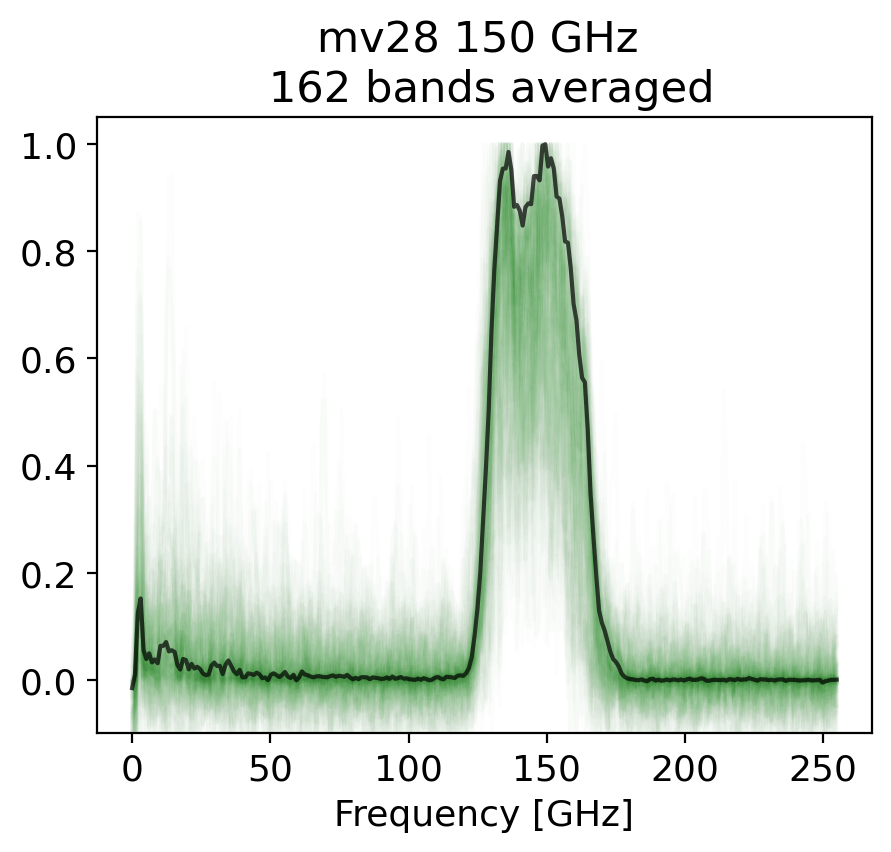

In [11]:
n_bands = len(all_attrs_150['total_band_data']['passbands'])
plt.plot(all_attrs_150['frequencies'] / 1e9, all_attrs_150['total_band_data']['passbands'].T, 
         alpha=0.01, color="green")
plt.plot(all_attrs_150['frequencies'] / 1e9, all_attrs_150['total_average_band'], color="black", 
        alpha=0.7)
plt.ylim(-0.1, 1.05)
plt.xlabel('Frequency [GHz]')
plt.title(f'mv28 150 GHz \n {n_bands} bands averaged')
plt.show()

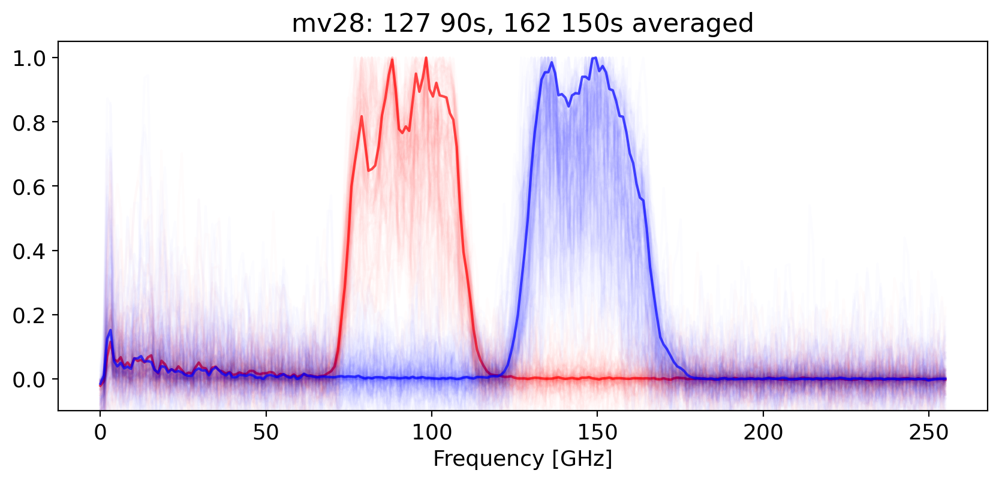

In [12]:
plt.figure(figsize=(10, 4))

plt.plot(all_attrs_90['frequencies'] / 1e9, all_attrs_90['total_band_data']['passbands'].T, 
         alpha=0.01, color="red")
plt.plot(all_attrs_90['frequencies'] / 1e9, all_attrs_90['total_average_band'], color="red", 
        alpha=0.7)

plt.plot(all_attrs_150['frequencies'] / 1e9, all_attrs_150['total_band_data']['passbands'].T, 
         alpha=0.01, color="blue")
plt.plot(all_attrs_150['frequencies'] / 1e9, all_attrs_150['total_average_band'], color="blue", 
        alpha=0.7)
plt.ylim(-0.1, 1.05)
#plt.xlim(120, 380)
plt.xlabel('Frequency [GHz]')

n_90 = len(all_attrs_90['total_band_data']['passbands'])
n_150 = len(all_attrs_150['total_band_data']['passbands'])
plt.title(f'mv28: {n_90} 90s, {n_150} 150s averaged')
plt.show()

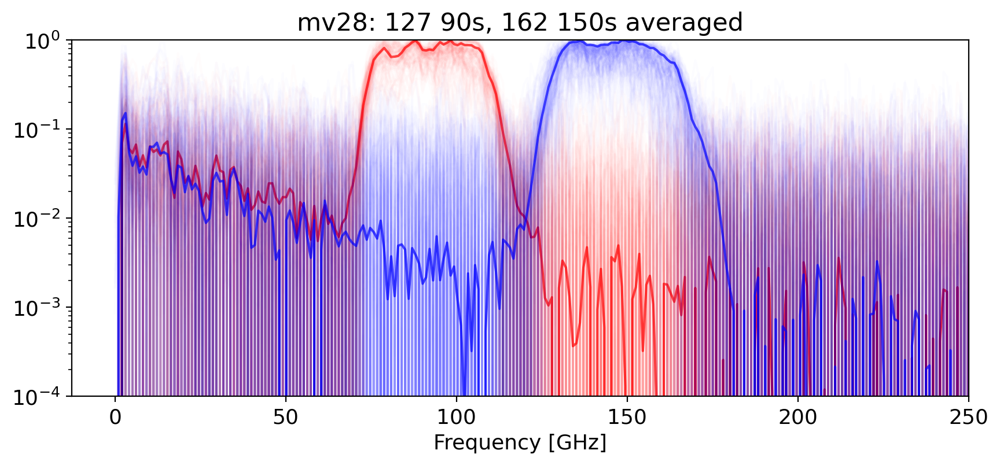

In [13]:
plt.figure(figsize=(10, 4))

plt.plot(all_attrs_90['frequencies'] / 1e9, all_attrs_90['total_band_data']['passbands'].T, 
         alpha=0.01, color="red")
plt.plot(all_attrs_90['frequencies'] / 1e9, all_attrs_90['total_average_band'], color="red", 
        alpha=0.7)

plt.plot(all_attrs_150['frequencies'] / 1e9, all_attrs_150['total_band_data']['passbands'].T, 
         alpha=0.01, color="blue")
plt.plot(all_attrs_150['frequencies'] / 1e9, all_attrs_150['total_average_band'], color="blue", 
        alpha=0.7)
plt.ylim(-0.1, 1.05)
plt.xlim(None, 250)
plt.xlabel('Frequency [GHz]')

n_90 = len(all_attrs_90['total_band_data']['passbands'])
n_150 = len(all_attrs_150['total_band_data']['passbands'])
plt.title(f'mv28: {n_90} 90s, {n_150} 150s averaged')
plt.yscale('log')
plt.ylim(1e-4, 1)
plt.show()

In [14]:
pickle.dump(all_attrs_90, open('band_data/all_attrs_90_integrated.p', 'wb'))
pickle.dump(all_attrs_150, open('band_data/all_attrs_150_integrated.p', 'wb'))

In [15]:
all_attrs_90['total_band_data']['attrs'][:, 0]

array([  70.,  171.,  224.,  226.,  253.,  267.,  272.,  277.,  282.,
        294.,  296.,  301.,  304.,  310.,  322.,  337.,  342.,  345.,
        350.,  368.,  399.,  403.,  435.,  663.,  667.,  672.,  677.,
        679.,  682.,  685.,  691.,  698.,  700.,  702.,  705.,  717.,
        719.,  722.,  724.,  729.,  735.,  737.,  742.,  744.,  747.,
        754.,  757.,  758.,  759.,  764.,  769.,  770.,  772.,  774.,
        783.,  787.,  790.,  795.,  796.,  810.,  812.,  818.,  823.,
        826.,  827.,  832.,  836.,  842.,  844.,  848.,  850.,  865.,
        866.,  870.,  875.,  880.,  881.,  882.,  886.,  897.,  915.,
        960.,  972., 1008., 1033., 1126., 1159., 1173., 1205., 1279.,
       1296., 1330., 1333., 1345., 1348., 1360., 1368., 1376., 1377.,
       1395., 1399., 1402., 1405., 1413., 1430., 1450., 1452., 1454.,
       1457., 1463., 1467., 1472., 1474., 1476., 1484., 1485., 1487.,
       1492., 1503., 1505., 1513., 1520., 1522., 1533., 1538., 1549.,
       1550.])

In [16]:
import sotodlib
from sotodlib import core
context_file = "context.yaml"
ctx = core.Context(context_file)
obs_list = ctx.obsdb.query("timestamp>1724000000 and timestamp<1726000000")
meta = ctx.get_meta(obs_list[145]['obs_id'])

In [17]:
meta.focal_plane.xi

array([-0.02302588, -0.02145854, -0.02034869, ..., -0.01936343,
       -0.02735081, -0.02642388], shape=(1775,), dtype=float32)

In [18]:
data_attrs[0]['bands'], data_attrs[0]['channels']

(array([0., 0., 0., ..., 7., 7., 7.], shape=(1775,)),
 array([  2.,   4.,   6., ..., 504., 507., 508.], shape=(1775,)))

In [94]:
ch_inds = np.asarray(all_attrs_90['total_band_data']['attrs'][:, 0], dtype='int')
bands = data_attrs[0]['bands'][ch_inds]
channels = data_attrs[0]['channels'][ch_inds]

In [173]:
chs = all_attrs_90['total_band_data']['attrs'][:, 0]
ch_inds = np.asarray(chs, dtype='int')
bands = data_attrs[0]['bands'][ch_inds]
channels = data_attrs[0]['channels'][ch_inds]

coords = []
attrs = []
for i, (b, c) in enumerate(zip(bands, channels)):
    match_ind = np.where((meta.det_info.smurf.band == b) & (meta.det_info.smurf.channel == c))[0]
    xi, eta = meta.focal_plane.xi[match_ind], meta.focal_plane.eta[match_ind]
    if meta.det_info.wafer.type[match_ind] != 'OPTC':
        #print(i, meta.det_info.wafer.type[i], " != opt")
        continue
    if all_attrs_90['total_band_data']['attrs'][:, 3][i] < 50:
        continue
    coords.append([xi, eta])
    attrs.append(all_attrs_90['total_band_data']['attrs'][:, 5][i])
coords = np.array(coords)

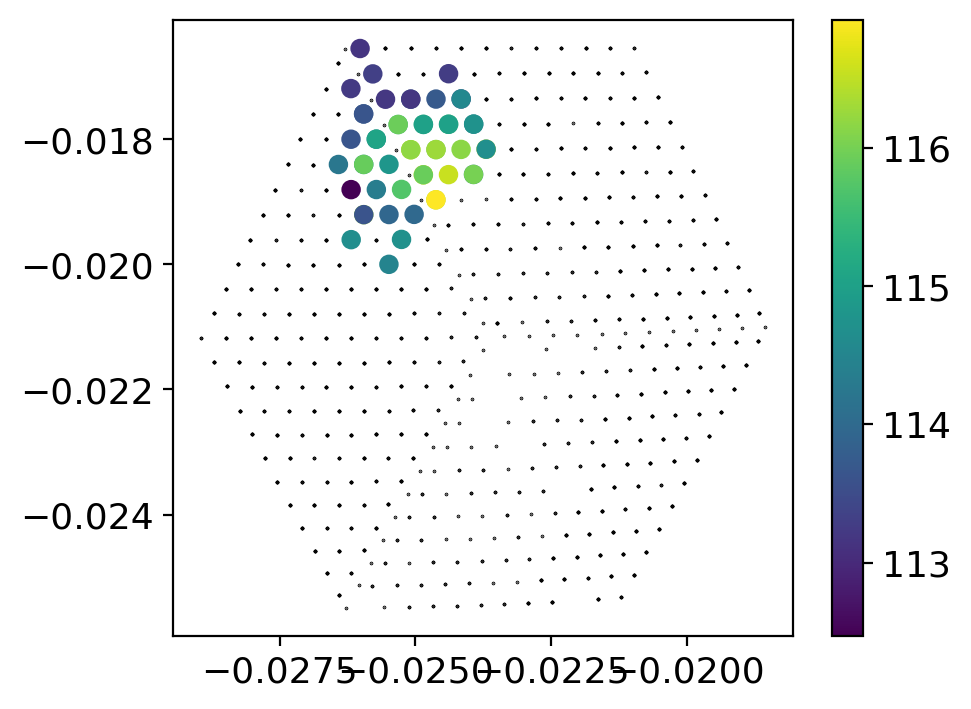

In [174]:
plt.scatter(meta.focal_plane.xi, meta.focal_plane.eta, s=0.1, color="black")
plt.scatter(coords[:, 0], coords[:, 1], c=attrs)
plt.colorbar()
plt.show()

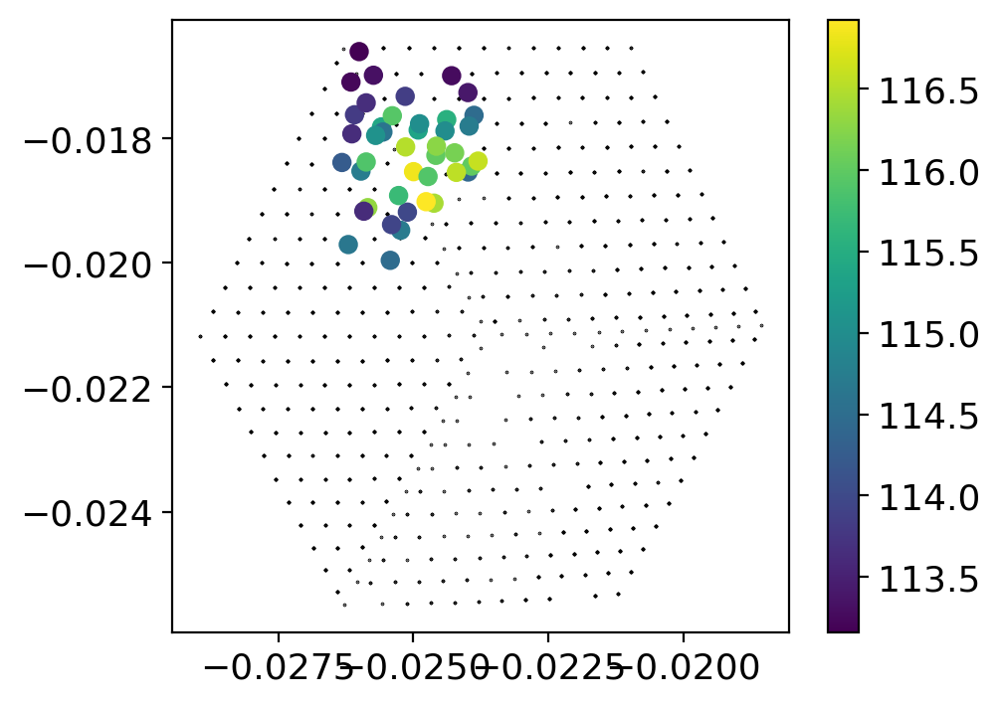

In [55]:
plt.scatter(meta.focal_plane.xi, meta.focal_plane.eta, s=0.1, color="black")
plt.scatter(coords[:, 0].T + np.random.normal(scale=0.0001, size=len(coords[:, 0])), 
            coords[:, 1].T + np.random.normal(scale=0.0001, size=len(coords[:, 1])), c=attrs, )#vmin=111)
#plt.scatter(coords[:, 0].T, coords[:, 1].T, c=attrs, )#vmin=111)

plt.colorbar()
plt.show()

In [203]:
coords = []
attrs = []
ch_inds = np.asarray(all_attrs_150['total_band_data']['attrs'][:, 0], dtype='int')
for i, det_id in enumerate(data_attrs[0]['det_ids'][ch_inds]):
    if det_id == 'NO_MATCH':
        print('no match')
        continue
    match_ind = np.where(meta.det_info.det_id == det_id)[0][0]
    xi, eta = meta.focal_plane.xi[match_ind], meta.focal_plane.eta[match_ind]
    if all_attrs_150['total_band_data']['attrs'][:, 3][i] < 50:
        continue
    if meta.det_info.wafer.type[match_ind] != 'OPTC':
        #print(i, meta.det_info.wafer.type[i], " != opt")
        continue
    coords.append([xi, eta])
    attrs.append(all_attrs_150['total_band_data']['attrs'][:, 4][i])

no match
no match
no match


In [204]:
coords = np.array(coords)

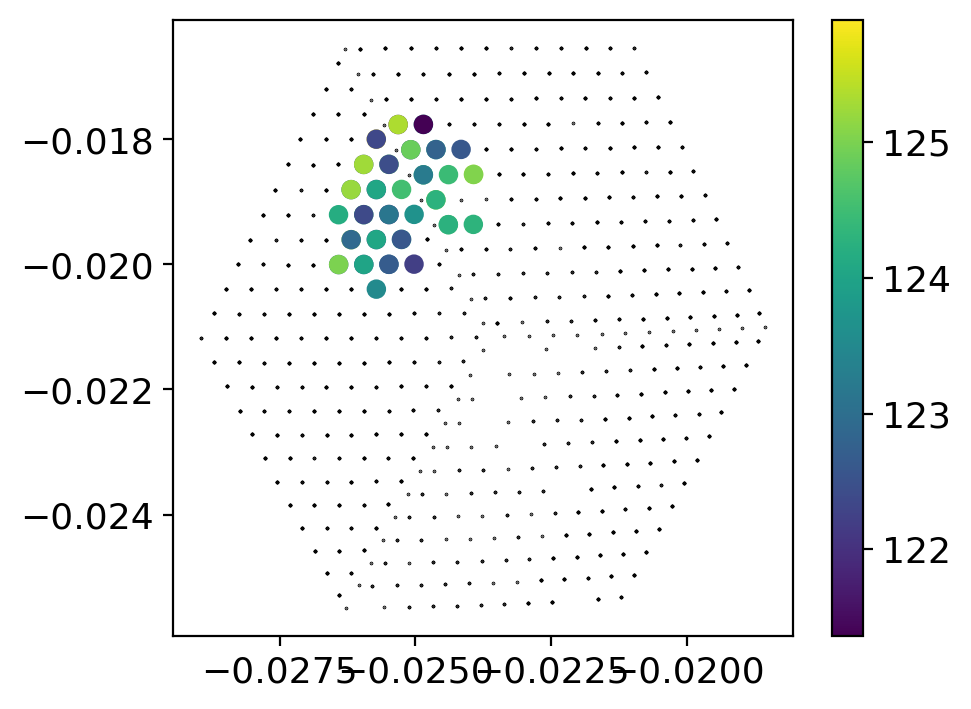

In [205]:
plt.scatter(meta.focal_plane.xi, meta.focal_plane.eta, s=0.1, color="black")
plt.scatter(coords[:, 0], coords[:, 1], c=attrs)
plt.colorbar()
plt.show()

In [100]:
np.min(attrs), np.max(attrs)

(np.float64(113.16208412644237), np.float64(116.92690787604354))

In [103]:
np.min(attrs), np.max(attrs)

(np.float64(112.47368580519174), np.float64(116.92690787604354))

In [ ]:
coords = []
attrs = []
ch_inds = np.asarray(all_attrs_90['total_band_data']['attrs'][:, 0], dtype='int')
for i, det_id in enumerate(data_attrs[0]['det_ids'][ch_inds]):
    if det_id == 'NO_MATCH':
        print('no match')
        continue
    match_ind = np.where(meta.det_info.det_id == det_id)[0][0]
    xi, eta = meta.focal_plane.xi[match_ind], meta.focal_plane.eta[match_ind]
    if all_attrs_90['total_band_data']['attrs'][:, 3][i] < 50:
        continue
    if meta.det_info.wafer.type[match_ind] != 'OPTC':
        #print(i, meta.det_info.wafer.type[i], " != opt")
        continue
    coords.append([xi, eta])
    attrs.append(all_attrs_90['total_band_data']['attrs'][:, 5][i])

In [192]:
x_locs = np.zeros(len(data_attrs[0]['bands']))
y_locs = np.zeros(len(data_attrs[0]['bands']))
pol_groups = np.chararray(len(data_attrs[0]['bands']))
pol_groups[:] = 't'
for i, det_id in enumerate(meta.det_info.det_id):
    if det_id == 'NO_MATCH':
        continue
    if meta.det_info.wafer.type[i] != 'OPTC':
        continue
    index = np.where((data_attrs[0]['det_ids'] == det_id))[0]
    if len(index) == 0:
        continue
    index = index[0]
    x_locs[index] = meta.focal_plane.xi[i]
    y_locs[index] = meta.focal_plane.eta[i]
    pol_groups[index] = meta.det_info.wafer.pol[i]

/tmp/ipykernel_2026096/2875742460.py:3: DeprecationWarning: `np.chararray` is deprecated and will be removed from the main namespace in the future. Use an array with a string or bytes dtype instead.
  pol_groups = np.chararray(len(data_attrs[0]['bands']))


In [193]:
import h5py
def save_individual_run_attrs(fname, frequencies, attrs, x_locs, y_locs, 
                              pol_groups, meta):
    with h5py.File('%s' %fname, 'w') as h5f:
        run_data = attrs['individual_run_data']
        for run in range(len(run_data['passbands'])):
            h5f.create_dataset('passband_data_%s' %run, data=run_data['passbands'][run])
            h5f.create_dataset('attrs_data_%s' %run, data=run_data['attrs'][run])
        h5f.create_dataset('frequencies', data=frequencies)
        h5f.create_dataset('x_loc', data=x_locs)
        h5f.create_dataset('y_loc', data=y_locs)
        #h5f.create_dataset('x_loc', data=x_locs_beam_map)
        #h5f.create_dataset('y_loc', data=y_locs_beam_map)
        h5f.create_dataset('pol_group', data=pol_groups)
        h5f.create_dataset('n_sets', data=len(attrs['individual_run_data']['passbands']))
        h5f.create_dataset('all_x_locs', data=meta.focal_plane.xi)
        h5f.create_dataset('all_y_locs', data=meta.focal_plane.eta)
        h5f.create_dataset('bands_channels', data=np.array([data_attrs[0]["bands"], 
                                                            data_attrs[0]["channels"]]))


save_individual_run_attrs("band_data/band_data_90_mv28.h5", all_attrs_90['frequencies'], 
           all_attrs_90, x_locs, y_locs, pol_groups, meta)
save_individual_run_attrs("band_data/band_data_150_mv28.h5", all_attrs_150['frequencies'], 
           all_attrs_150, x_locs, y_locs, pol_groups, meta)